## Exploratory Data Analysis (EDA)

Conducting EDA on the NHL shot data from 2007 through 2022 to examine relationships between variables and identify patterns in the data. The purpose is to gain insight on which variables will be most important when predicting the amount of goals a player will score in a season.  
I believe factors such as the distance from the net, angle of the shot, type of shot, and what happened before the shot are going to be key factors in my model.  
In addition, I believe there maybe columns that can be eliminated/left out of the final model since they are providing very similar information.

In [1]:
#Load relevant Libraries

import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale, normalize
import os
from pandas.api.types import CategoricalDtype

## Load and Inspect Dataframe

In [2]:
#load data

shots_07_22_cleaned = pd.read_csv(r"C:\Users\Travi\OneDrive\Documents\GitHub\Springboard-Data-Science-Capstone-Project-2\Cleaned_data\shots_07_22_cleaned.csv")
shots_07_22_cleaned.head()

,shotID,homeTeamCode,awayTeamCode,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,team,...,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,teamCode,arenaAdjustedXCordABS,power_play,situation,distance_bin,angle_bin,angle_bin_str
0,0,NSH,SJS,2022,20001,8,1.0,6,1,AWAY,...,0.022987,0.710473,1.0,SJS,47.0,0,5v5,"(44, 46]","[10, 15)","[10, 15)"
1,2,NSH,SJS,2022,20001,15,2.0,3,1,HOME,...,0.027936,0.644651,1.0,NSH,31.0,0,5v5,"(56, 58]","[-10, -5)","[-10, -5)"
2,3,NSH,SJS,2022,20001,16,0.0,2,1,HOME,...,0.024885,0.898032,1.0,NSH,76.0,0,5v5,"(14, 16]","[15, 20)","[15, 20)"
3,4,NSH,SJS,2022,20001,18,1.0,11,1,HOME,...,0.019556,0.759405,1.0,NSH,82.0,0,5v5,"(16, 18]","[-65, -60)","[-65, -60)"
4,6,NSH,SJS,2022,20001,26,25.0,7,1,AWAY,...,0.022000,0.536515,1.0,SJS,75.0,0,5v5,"(16, 18]","[5, 10)","[5, 10)"


In [3]:
#Verify column names are correct

shots_07_22_cleaned.columns

Index(['shotID', 'homeTeamCode', 'awayTeamCode', 'season', 'game_id', 'id',
       'timeUntilNextEvent', 'timeSinceLastEvent', 'period', 'team',
       'location', 'event', 'goal', 'shotGeneratedRebound', 'xCord', 'yCord',
       'xCordAdjusted', 'yCordAdjusted', 'shotAngle', 'shotAngleAdjusted',
       'shotAnglePlusRebound', 'shotAngleReboundRoyalRoad', 'shotDistance',
       'shotType', 'shotOnEmptyNet', 'shotRebound',
       'shotAnglePlusReboundSpeed', 'shotRush', 'speedFromLastEvent',
       'lastEventxCord', 'lastEventyCord', 'distanceFromLastEvent',
       'lastEventShotAngle', 'lastEventShotDistance', 'lastEventCategory',
       'homeEmptyNet', 'awayEmptyNet', 'homeSkatersOnIce', 'awaySkatersOnIce',
       'awayPenalty1Length', 'homePenalty1Length',
       'playerPositionThatDidEvent', 'playerNumThatDidEvent',
       'lastEventxCord_adjusted', 'lastEventyCord_adjusted',
       'timeSinceFaceoff', 'shooterPlayerId', 'shooterName',
       'shooterLeftRight', 'arenaAdjustedShotDi

In [4]:
#Check shape to verify dataframe loaded as excpected

shots_07_22_cleaned.shape

(1239049, 68)

In [5]:
#Verify that there is no missing values

missing = pd.concat([shots_07_22_cleaned.isnull().sum(), 100 * shots_07_22_cleaned.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='%', ascending=False)

,count,%
angle_bin_str,2735,0.220734
angle_bin,2735,0.220734
distance_bin,2,0.000161
playerNumThatDidEvent,0,0.000000
shooterLeftRight,0,0.000000
...,...,...
speedFromLastEvent,0,0.000000
lastEventxCord,0,0.000000
lastEventyCord,0,0.000000
distanceFromLastEvent,0,0.000000


In [6]:
#Descriptive statistics to get a sense of the data distubutions

shots_07_22_cleaned.describe()

,shotID,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,goal,shotGeneratedRebound,xCord,...,xGoal,xFroze,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,arenaAdjustedXCordABS,power_play
count,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,...,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1239049.0,1.239049e+06,1.239049e+06
mean,7.443812e+05,2.014586e+03,2.129817e+04,1.601133e+02,9.946863e+00,1.553554e+01,2.031719e+00,9.213598e-02,5.961588e-02,2.726785e-01,...,7.133006e-02,1.646989e-01,5.018846e-02,3.921434e-01,2.969566e-01,2.335783e-02,7.304724e-01,1.0,5.960327e+01,1.986564e-01
std,4.827778e+05,4.656415e+00,2.512397e+03,9.215437e+01,1.459744e+01,1.491295e+01,8.472311e-01,2.892179e-01,2.367739e-01,6.335969e+01,...,1.020332e-01,6.045404e-02,2.442053e-02,9.246095e-02,1.051429e-01,9.835124e-03,1.106631e-01,0.0,1.884249e+01,3.989889e-01
min,0.000000e+00,2.007000e+03,2.000100e+04,2.000000e+00,-2.147000e+03,-1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,-9.900000e+01,...,1.000000e-03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,0.000000e+00,0.000000e+00
25%,3.062510e+05,2.010000e+03,2.031900e+04,8.100000e+01,1.000000e+00,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,-6.300000e+01,...,1.493150e-02,1.251200e-01,3.526130e-02,3.559870e-01,2.510120e-01,1.942150e-02,6.756440e-01,1.0,4.500000e+01,0.000000e+00
50%,7.346440e+05,2.015000e+03,2.063900e+04,1.590000e+02,4.000000e+00,1.100000e+01,2.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00,...,3.594560e-02,1.562830e-01,4.362420e-02,4.099420e-01,2.948720e-01,2.166450e-02,7.289150e-01,1.0,6.200000e+01,0.000000e+00
75%,1.165168e+06,2.018000e+03,2.098000e+04,2.350000e+02,1.400000e+01,2.100000e+01,3.000000e+00,0.000000e+00,0.000000e+00,6.400000e+01,...,8.650740e-02,1.956850e-01,6.016870e-02,4.488350e-01,3.241900e-01,2.480720e-02,7.864090e-01,1.0,7.600000e+01,0.000000e+00
max,1.595716e+06,2.022000e+03,3.041700e+04,7.760000e+02,1.284000e+03,2.340000e+02,8.000000e+00,1.000000e+00,1.000000e+00,9.900000e+01,...,9.877570e-01,7.647630e-01,2.833440e-01,7.271680e-01,9.590000e-01,5.826250e-01,9.934680e-01,1.0,9.900000e+01,1.000000e+00


## Wrangle Data

After reviewing the data frame, there is a couple of features I would like to add:  
* power play goals
* scoring situation

This is because in these situations the amount of skaters on the ice is imbalanced between the teams and, in theory, should increase the probability of a goal.  

In [7]:
#Add a new column to the dataframe to easily identify Power Play goals

shots_07_22_cleaned['power_play'] = shots_07_22_cleaned.apply\
                                    (lambda row: "1" if row['homePenalty1Length'] or row['awayPenalty1Length'] > 0 else "0", axis=1)
shots_07_22_cleaned['power_play'] = shots_07_22_cleaned['power_play'].astype(int)

In [8]:
#Subset the data to include only shots that were goals
#We are interested in what these shots have in common that lead to a goal

all_goals = shots_07_22_cleaned.loc[shots_07_22_cleaned['goal'] != 0].copy()
all_goals.shape

(114161, 68)

In [9]:
#Add a new column to the dataframe to identify how many skaters from each team were on the ice at the time of the goal.

def determine_situation(row):
    if row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 6:
        return '5v6'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 6 and row.loc['awaySkatersOnIce'] == 5:
        return '6v5'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 4:
        return '5v4'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 3:
        return '5v3'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 4 and row.loc['awaySkatersOnIce'] == 5:
        return '4v5'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 3 and row.loc['awaySkatersOnIce'] == 5:
        return '3v5'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 6:
        return '6v5'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 6 and row.loc['awaySkatersOnIce'] == 5:
        return '5v6'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 4 and row.loc['awaySkatersOnIce'] == 5:
        return '5v4'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 3 and row.loc['awaySkatersOnIce'] == 5:
        return '5v3'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 4:
        return '4v5'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 3:
        return '3v5'
    else:
        return '5v5'

# Adding the new column

all_goals['situation'] = all_goals.apply(determine_situation, axis=1)
all_goals.head()

,shotID,homeTeamCode,awayTeamCode,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,team,...,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,teamCode,arenaAdjustedXCordABS,power_play,situation,distance_bin,angle_bin,angle_bin_str
2,3,NSH,SJS,2022,20001,16,0.0,2,1,HOME,...,0.024885,0.898032,1.0,NSH,76.0,0,5v5,"(14, 16]","[15, 20)","[15, 20)"
11,16,NSH,SJS,2022,20001,62,0.0,27,1,AWAY,...,0.021140,0.800991,1.0,SJS,80.0,0,5v5,"(16, 18]","[-50, -45)","[-50, -45)"
25,38,NSH,SJS,2022,20001,143,0.0,20,2,HOME,...,0.022092,0.693893,1.0,NSH,65.0,0,5v5,"(28, 30]","[25, 30)","[25, 30)"
44,64,NSH,SJS,2022,20001,215,0.0,9,2,HOME,...,0.020686,0.708772,1.0,NSH,66.0,0,5v5,"(28, 30]","[20, 25)","[20, 25)"
62,91,NSH,SJS,2022,20001,318,32.0,45,3,HOME,...,0.011140,0.719935,1.0,NSH,60.0,0,5v6,"(36, 38]","[-30, -25)","[-30, -25)"


In [10]:
shots_07_22_cleaned['situation'] = shots_07_22_cleaned.apply(determine_situation, axis=1)
shots_07_22_cleaned.head()

,shotID,homeTeamCode,awayTeamCode,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,team,...,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,teamCode,arenaAdjustedXCordABS,power_play,situation,distance_bin,angle_bin,angle_bin_str
0,0,NSH,SJS,2022,20001,8,1.0,6,1,AWAY,...,0.022987,0.710473,1.0,SJS,47.0,0,5v5,"(44, 46]","[10, 15)","[10, 15)"
1,2,NSH,SJS,2022,20001,15,2.0,3,1,HOME,...,0.027936,0.644651,1.0,NSH,31.0,0,5v5,"(56, 58]","[-10, -5)","[-10, -5)"
2,3,NSH,SJS,2022,20001,16,0.0,2,1,HOME,...,0.024885,0.898032,1.0,NSH,76.0,0,5v5,"(14, 16]","[15, 20)","[15, 20)"
3,4,NSH,SJS,2022,20001,18,1.0,11,1,HOME,...,0.019556,0.759405,1.0,NSH,82.0,0,5v5,"(16, 18]","[-65, -60)","[-65, -60)"
4,6,NSH,SJS,2022,20001,26,25.0,7,1,AWAY,...,0.022000,0.536515,1.0,SJS,75.0,0,5v5,"(16, 18]","[5, 10)","[5, 10)"


## Evaluating Feature Distubutions

I was most interested in the following key features due to their potential impact on whether a shot is a goal.  

•	Shot type  
•	Distance from goal  
•	Shot angle  
•	Situation  
•	Player Position  
•	Shooter handiness  
•	Shot rebounds

### Shot Type

In [11]:
#Veiwing total shots by shot type
shot_total_by_type = shots_07_22_cleaned['shotType'].value_counts().reset_index()
shot_total_by_type

,shotType,count
0,WRIST,632452
1,SLAP,230371
2,SNAP,181596
3,BACK,99972
4,TIP,61708
5,DEFL,18519
6,WRAP,14431


In [12]:
#Grouping shot types and adding xGoals to shot counts
goals_by_shot_type = all_goals.groupby('shotType').agg(
     Avg_xG=('xGoal', 'mean')
).reset_index()

# Step 2: Calculate shot type counts
shot_type_counts = shots_07_22_cleaned['shotType'].value_counts().reset_index()
shot_type_counts.columns = ['shotType', 'Count']  # Rename columns to match

# Step 3: Merge the two DataFrames on 'shotType'
goals_by_shot_type = pd.merge(goals_by_shot_type, shot_type_counts, on='shotType', how='left')

goals_by_shot_type

,shotType,Avg_xG,Count
0,BACK,0.218585,99972
1,DEFL,0.203793,18519
2,SLAP,0.145313,230371
3,SNAP,0.182121,181596
4,TIP,0.219842,61708
5,WRAP,0.146780,14431
6,WRIST,0.221839,632452


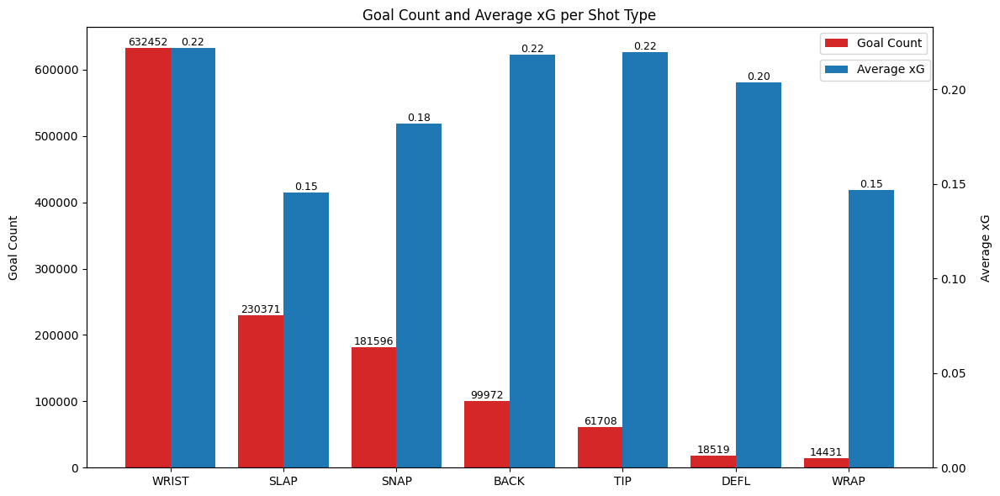

In [13]:
df = goals_by_shot_type.sort_values(by='Count', ascending=False).reset_index(drop=True)
x = np.arange(len(df))  # Numeric positions for x-axis
bar_width = 0.4

fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar plot for Goal Count (left y-axis)
color1 = 'tab:red'
bars1 = ax1.bar(x - bar_width/2, df['Count'], 
                width=bar_width, label='Goal Count', color=color1) #order=goals_by_shot_type['shotType'].sort_values(ascending=False))
ax1.set_ylabel('Goal Count', labelpad=12)
ax1.tick_params(axis='y')
plt.grid(False)

# Add value labels to first bar
for bar in bars1:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height + 0.01, f'{int(height)}',
             ha='center', va='bottom', fontsize=9)

# Second y-axis for Avg_xG
ax2 = ax1.twinx()

color2 = 'tab:blue'
bars2 = ax2.bar(x + bar_width/2, df['Avg_xG'], 
                width=bar_width, label='Average xG', color=color2)
ax2.set_ylabel('Average xG', labelpad=12)
ax2.tick_params(axis='y')

# Add value labels to second bar
for bar in bars2:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2, height, f'{height:.2f}',
             ha='center', va='bottom', fontsize=9)

# Set x-axis labels
ax1.set_xticks(x)
ax1.set_xticklabels(df['shotType'])

# Title and layout
plt.title("Goal Count and Average xG per Shot Type")
plt.grid(False)
fig.tight_layout()
#ax1.legend()
#ax2.legend()
ax1.legend(loc='upper left',   bbox_to_anchor=(0.86, 1),
    borderaxespad=0.5,
    labelspacing=1.2,
    fontsize=10) 
ax2.legend(loc='upper left',   bbox_to_anchor=(0.86, 0.94),
    borderaxespad=0.5,
    labelspacing=1.2,
    fontsize=10) 
plt.show()

In [14]:
# Create dataframe for goal and xGoal conversion rates by shot type
conversion_df_shot_type = shots_07_22_cleaned.groupby('shotType').agg(
    total_shots=('goal', 'count'),
    total_goals=('goal', 'sum'),
    total_xG=('xGoal', 'sum')
).reset_index()

# Calculate conversion rates
conversion_df_shot_type['goal_conversion'] = conversion_df_shot_type['total_goals'] / conversion_df_shot_type['total_shots']
conversion_df_shot_type['xG_conversion'] = conversion_df_shot_type['total_xG'] / conversion_df_shot_type['total_shots']

In [15]:
#Convert to long format
melted_df_shot_type = conversion_df_shot_type.melt(id_vars='shotType', 
                               value_vars=['goal_conversion', 'xG_conversion'],
                               var_name='metric', 
                               value_name='rate')

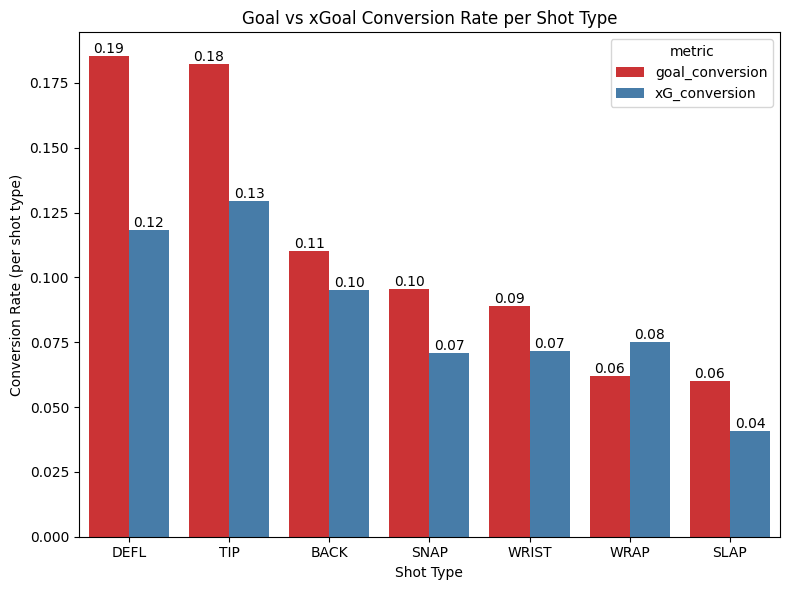

In [16]:
# Order shot time conversion in descending order
melted_df_shot_type = melted_df_shot_type.sort_values(by='rate', ascending=False).reset_index(drop=True)

#Plot goal and xGoal coversion rates by shot type
plt.figure(figsize=(8,6))
ax =sns.barplot(data=melted_df_shot_type, x='shotType', y='rate', hue='metric', palette="Set1")

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')  # or use fmt='%.2f' for floats

plt.title('Goal vs xGoal Conversion Rate per Shot Type')
plt.ylabel('Conversion Rate (per shot type)')
plt.xlabel('Shot Type')
plt.tight_layout()
plt.show()

### Observations: 

Wrist shots were by far the most common shot type for all goals scored in the dataset. There were nearly 39,000 more wrist shots scored than the nearest shot type, the snapshot. Wrist shots also had one of the highest average xGoal probability, which is the likelihood of a shot being a goal. However, wrist shots were also the most common shot from all shots in the entire dataset. This is why we then investigated the conversion rate on each shot type. What is interesting is we see that wrist shots have lower conversion rates when investigating the goal and XGoal conversion rates per shot type. Wrist shots only have a 9% conversion rate compared to deflections which have a conversion rate around 19%. We also see that shot types with the highest average xGoal probability tended to have higher conversion rates. 
	
This does make sense when applying some domain knowledge. Shot types like deflections, and tip-ins generally occur close to the net at favorable angles. Slap shots on the other hand tend to be taken further away and take longer, meaning the goalie has more time to react to the shot.  

### Shot Distance

In [17]:
# Descriptive statistics for shot distance of all goals 
print(f'Descriptive stats shot distance for all goals:\n{all_goals.shotDistance.describe()}')

Descriptive stats shot distance for all goals:
count    114161.000000
mean         23.050147
std          16.064298
min           1.000000
25%          10.770330
50%          18.027756
75%          31.144823
max          97.989795
Name: shotDistance, dtype: float64


In [18]:
# Create dataframe for goal and xGoal conversion rates by shot type
conversion_df_shot_distance = shots_07_22_cleaned.groupby('shotDistance').agg(
    total_shots=('goal', 'count'),
    total_goals=('goal', 'sum'),
    total_xG=('xGoal', 'sum')
).reset_index()

# Calculate conversion rates
conversion_df_shot_distance['goal_conversion'] = conversion_df_shot_distance['total_goals'] / conversion_df_shot_distance['total_shots']
conversion_df_shot_distance['xG_conversion'] = conversion_df_shot_distance['total_xG'] / conversion_df_shot_distance['total_shots']

In [19]:
# Prepare dataframe for plotting
melted_df_shot_distance = conversion_df_shot_distance.melt(id_vars='shotDistance', 
                               value_vars=['goal_conversion', 'xG_conversion'],
                               var_name='metric', 
                               value_name='rate')

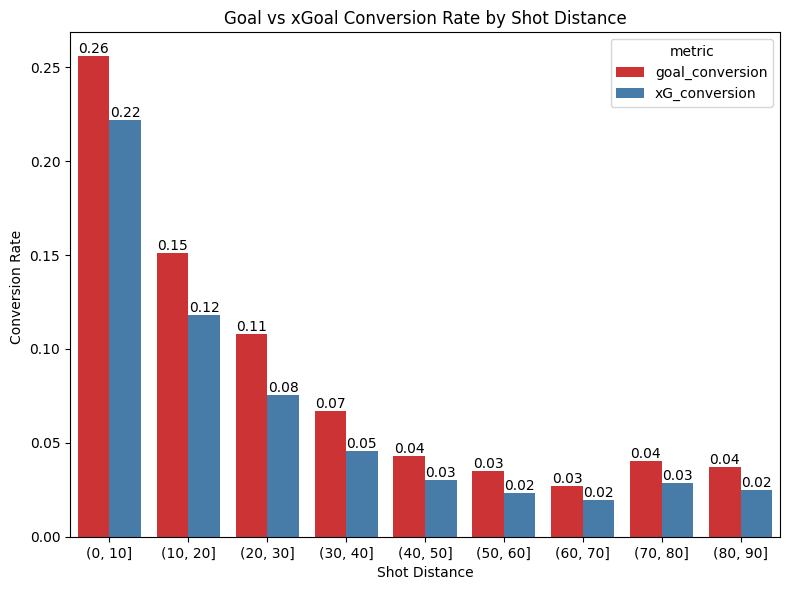

In [20]:
# Create bins for ploting goal conversions by shot distance
melted_df_shot_distance['distance_bin'] = pd.cut(melted_df_shot_distance['shotDistance'], bins=np.arange(0, 100, 10))  # every 10 feet

# Plotting goal and xGoal conversion rates by shot distance
plt.figure(figsize=(8,6))
ax =sns.barplot(data=melted_df_shot_distance, x='distance_bin', y='rate', hue='metric', palette="Set1", errorbar=None)

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')  # or use fmt='%.2f' for floats

plt.title('Goal vs xGoal Conversion Rate by Shot Distance')
plt.ylabel('Conversion Rate ')
plt.xlabel('Shot Distance')
plt.tight_layout()
plt.show()

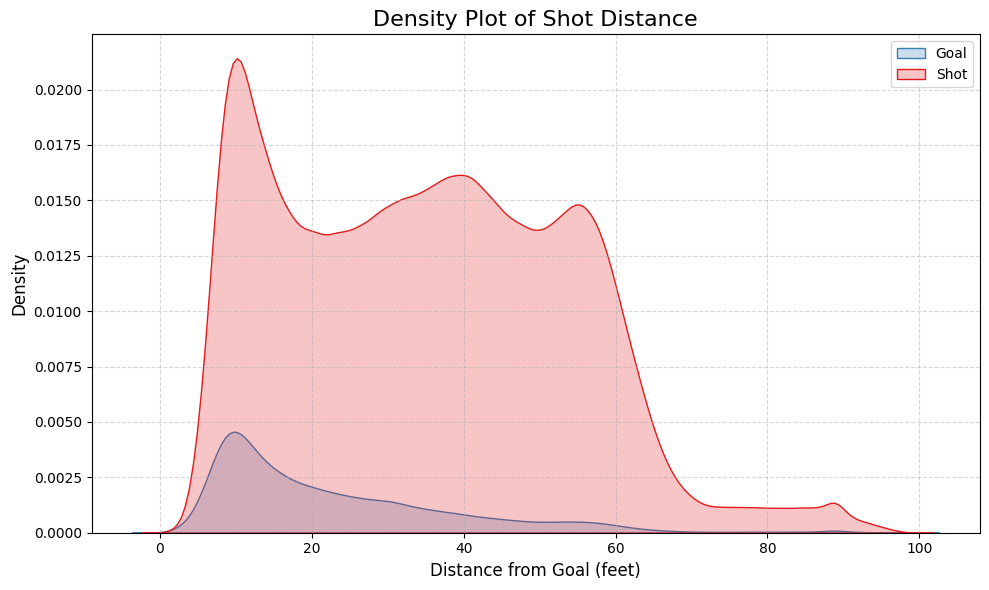

In [15]:
plt.figure(figsize=(10, 6))

sns.kdeplot(data=shots_07_22_cleaned, x='shotDistance', hue='goal', fill=True, palette="Set1")

plt.title('Density Plot of Shot Distance', fontsize=16)
plt.xlabel('Distance from Goal (feet)', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(["Goal", "Shot"])

plt.tight_layout()
plt.show()

### Observations  

As expected, shots closer to the goal had higher xGoal probability and resulted in higher goal rates. Most goals occurred within 32 feet or less of the net with an average distance of 23 feet. This means players can generate higher-quality scoring opportunities if more shots are taken from close range

### Shot Angle

In [21]:
# Descriptive statistics for shot distance of all goals 
print(f'Descriptive stats for shot angles of all goals:\n{all_goals.shotAngle.describe()}')

Descriptive stats for shot angles of all goals:
count    114161.000000
mean         -1.428368
std          32.926067
min         -88.567904
25%         -24.775141
50%           0.000000
75%          22.306205
max          88.492564
Name: shotAngle, dtype: float64


In [22]:
# Creating bins for shot distance and shot angle for heatmap 
shots_07_22_cleaned['distance_bin'] = pd.cut(shots_07_22_cleaned['shotDistance'], bins=np.arange(0, 100, 2))  # every 2 feet
shots_07_22_cleaned['angle_bin'] = pd.cut(shots_07_22_cleaned['shotAngle'], bins=np.arange(-90, 90, 2))  # every 2degrees

In [23]:
#Creating goal rates and shot rates to calculate conversion rates
goal_rates = (shots_07_22_cleaned.groupby(['distance_bin', 'angle_bin'], observed=True)['goal']).mean().unstack()
shot_counts = (shots_07_22_cleaned.groupby(['distance_bin', 'angle_bin'], observed=True)['goal']).count().unstack()
# Filter goal rates to only show bins with >= 100 shots
min_shots = 100
filtered_goal_rates = goal_rates.where(shot_counts >= min_shots)

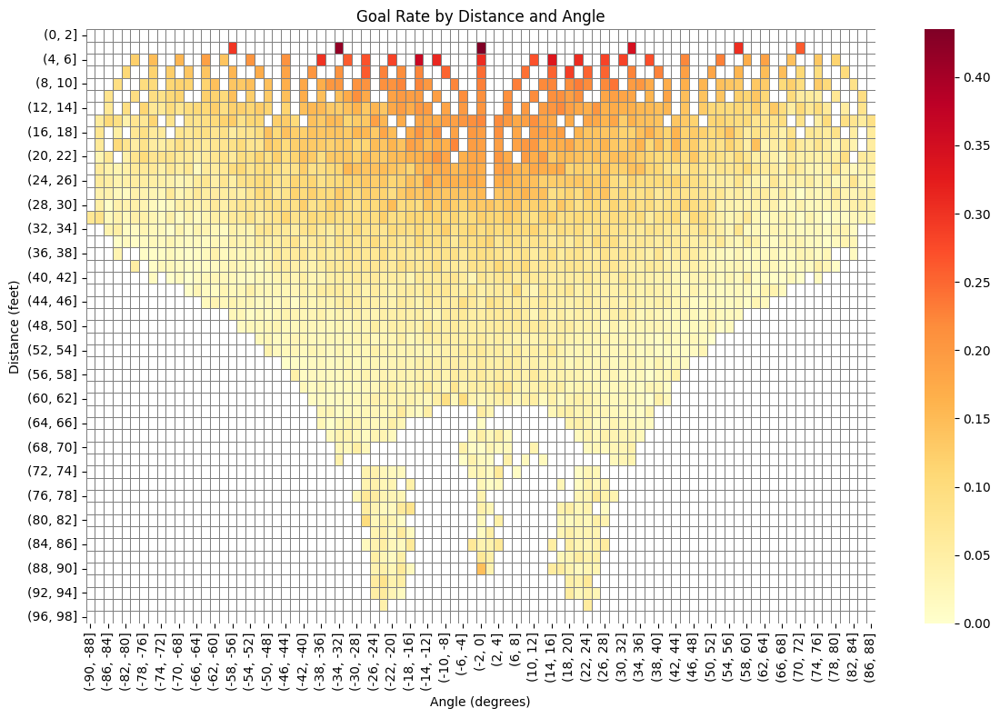

In [24]:
# Heatmap to visualize goal conversion rates based on shot distance and shot angles 
plt.figure(figsize=(12, 8))
sns.heatmap(filtered_goal_rates, cmap="YlOrRd", linewidths=0.5, linecolor='gray')
plt.title('Goal Rate by Distance and Angle')
plt.xlabel('Angle (degrees)')
plt.ylabel('Distance (feet)')
plt.tight_layout()
plt.show()

### Observations  

Shot angle is the shooting angle relative to the net. 0° is straight in front of the net, 90° is from the side boards. Similar to distance from goal, most goals are scored from tight angles close to 0°.  The average shot angle of all goals in the data set was -1.5° with most goals being scored from a range of -24°and 22°.

Intuitively, one would assume that shot angle and shot distance would have a moderate to strong correlation with each other. Meaning shots that are closer to the goal and closer to an angle of 0° would produce higher goal rates.  

From the heatmap above we see our assumption seems to hold true. Shots that are closer to the goal and at angles close to 0° had higher goal rates than shots that are from further distances and wider angles.

### Situation

Total percentage of goals scored on the Power Play: 16.92 %


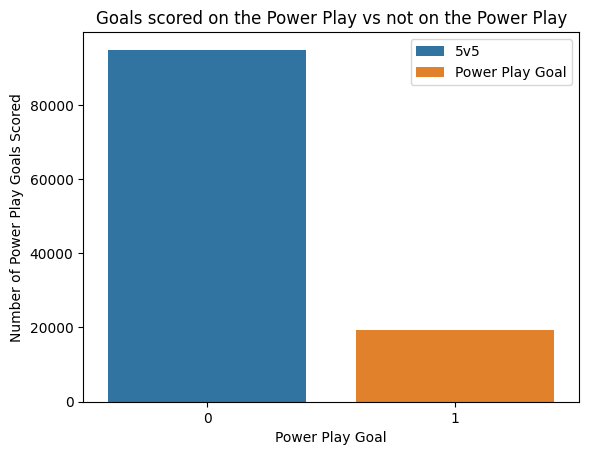

In [25]:
#Looking at distubution of Power Play goals

pp_goals = all_goals[all_goals['power_play']!=0]
sns.countplot(data=all_goals, x='power_play',  hue='power_play')
plt.xlabel('Power Play Goal')
plt.ylabel('Number of Power Play Goals Scored')
plt.title('Goals scored on the Power Play vs not on the Power Play')
plt.legend(["5v5", "Power Play Goal"])

total = len(all_goals)
pp_goals = (all_goals['power_play']!=0).sum()
print(f"Total percentage of goals scored on the Power Play: {(100 * (pp_goals/total)):.2f} %")

Power play goals only accounted for 16.92% of the total goals scored. This is a little bit lower than I initially thought it would be. I was expecting a number a little closer to 20%.

In [26]:
# Creating goal and xGoal conversion dataframe for game situation
conversion_df_situation = shots_07_22_cleaned.groupby('situation').agg(
    total_shots=('goal', 'count'),
    total_goals=('goal', 'sum'),
    total_xG=('xGoal', 'sum')
).reset_index()

# Calculate conversion rates
conversion_df_situation['goal_conversion'] = conversion_df_situation['total_goals'] / conversion_df_situation['total_shots']
conversion_df_situation['xG_conversion'] = conversion_df_situation['total_xG'] / conversion_df_situation['total_shots']

In [27]:
# Convert to long format for seaborn
melted_df_situation = conversion_df_situation.melt(id_vars='situation', 
                               value_vars=['goal_conversion', 'xG_conversion'],
                               var_name='metric', 
                               value_name='rate')

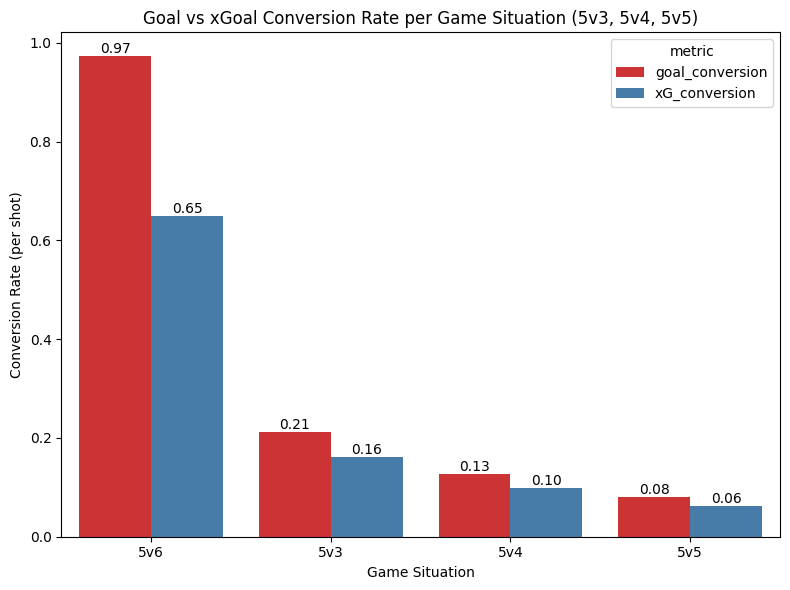

In [28]:
# Filter to keep only the desired situations
filtered_df = melted_df_situation[melted_df_situation['situation'].isin(['5v6','5v3', '5v4', '5v5'])]

order_list = ['5v6','5v3', '5v4', '5v5']

# Plot conversion rates by situation
plt.figure(figsize=(8,6))
ax =sns.barplot(data=filtered_df, x='situation', y='rate', hue='metric', order=order_list, palette="Set1")

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')  # or use fmt='%.2f' for floats

plt.title('Goal vs xGoal Conversion Rate per Game Situation (5v3, 5v4, 5v5)')
plt.ylabel('Conversion Rate (per shot)')
plt.xlabel('Game Situation')
plt.tight_layout()
plt.show()

### Observations  

The total percentage of all goals that were scored on the power play was 16.92 %. The standard power play, which consists of one team having 4 players on the ice and one team having 5 players on the ice (4v5), was not the only situation that was investigated. Other situations including 3v5 and 5v6 were also explored. Goal conversion rates, as expected, were the highest in 5v6 situations because there was not goalie in the net when the shot was taken. This situation had a 97.3% goal conversion rate. The next highest goal conversion rate was in the 3v5 situation when one team has a 2-player advantage on the ice. This had a goal conversion rate of 21.3% where the standard powerplay had a goal conversion rate of 12.6%. All these situations had higher goal conversion rates than even 5v5 situations which had a goal conversion rate of only 8.1%. The xGoal probability conversion rate for each situation followed the same pattern as goal conversion. 

### Player Position

In [29]:
goals_by_position = all_goals.groupby('playerPositionThatDidEvent')['goal'].sum()
goals_by_position = pd.DataFrame(goals_by_position).reset_index()

In [30]:
goals_by_position

,playerPositionThatDidEvent,goal
0,C,46586
1,D,17116
2,G,4
3,L,26102
4,R,24353


In [18]:
# Creating goal and xGoal conversion dataframe for player position
conversion_df_player_position = shots_07_22_cleaned.groupby('playerPositionThatDidEvent').agg(
    total_shots=('goal', 'count'),
    total_goals=('goal', 'sum'),
    total_xG=('xGoal', 'sum')
).reset_index()

# Calculate conversion rates
conversion_df_player_position ['goal_conversion'] = conversion_df_player_position ['total_goals'] / conversion_df_player_position ['total_shots']
conversion_df_player_position ['xG_conversion'] = conversion_df_player_position ['total_xG'] / conversion_df_player_position ['total_shots']

In [19]:
conversion_df_player_position['goal_conversion'] =  100 * (conversion_df_player_position['goal_conversion'])
conversion_df_player_position[['playerPositionThatDidEvent','goal_conversion']].sort_values(by='goal_conversion', ascending=False)

,playerPositionThatDidEvent,goal_conversion
0,C,10.929472
3,L,10.907966
4,R,10.670517
2,G,6.557377
1,D,4.957912


In [21]:
df_melt

,playerPositionThatDidEvent,Metric,Value
0,C,total_goals,46586.000000
1,D,total_goals,17116.000000
2,G,total_goals,4.000000
3,L,total_goals,26102.000000
4,R,total_goals,24353.000000
5,C,goal_conversion,10.929472
6,D,goal_conversion,4.957912
7,G,goal_conversion,6.557377
8,L,goal_conversion,10.907966
9,R,goal_conversion,10.670517


C:\Users\Travi\AppData\Local\Temp\ipykernel_19444\1539488273.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(positions)


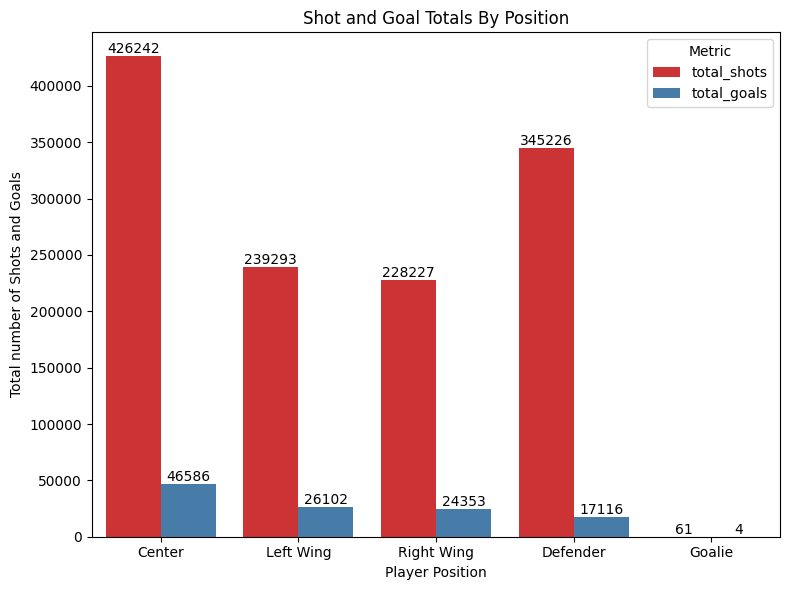

In [34]:
conversion_df_player_position_melted = conversion_df_player_position.melt(id_vars='playerPositionThatDidEvent', value_vars=['total_shots', 'total_goals'], 
                  var_name='Metric', value_name='Value')

positions = ['Center', 'Left Wing', 'Right Wing', 'Defender', 'Goalie']
order = ['C', 'L', 'R', 'D', 'G']
# Create the bar plot
plt.figure(figsize=(8,6))
ax = sns.barplot(data=conversion_df_player_position_melted, x='playerPositionThatDidEvent', y='Value', hue='Metric', order = order, palette="Set1")

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f')  # or use fmt='%.2f' for floats

plt.title('Shot and Goal Totals By Position')
plt.ylabel('Total number of Shots and Goals')
plt.xlabel('Player Position')
ax.set_xticklabels(positions)
plt.tight_layout()
plt.tight_layout()
plt.show()

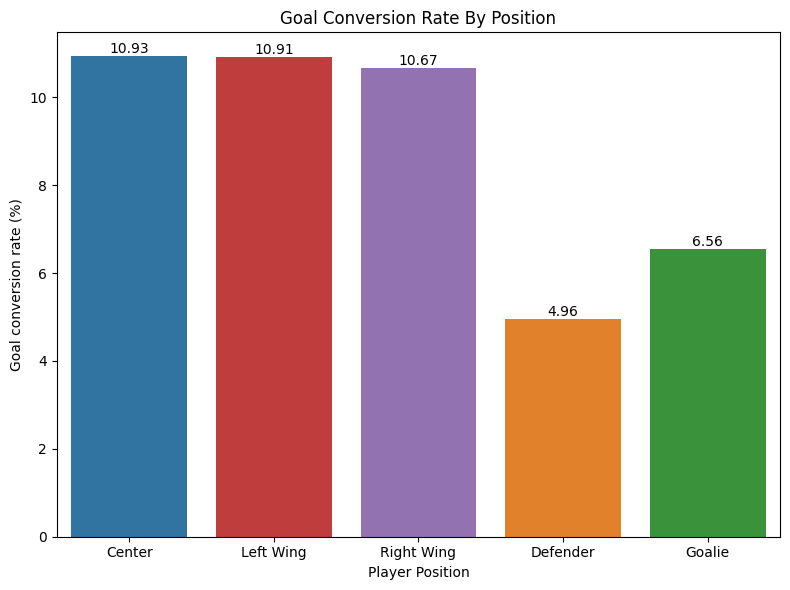

In [35]:
order = ['C', 'L', 'R', 'D', 'G']
positions = ['Center', 'Left Wing', 'Right Wing', 'Defender', 'Goalie']
x = np.arange(len(positions))


# Create the bar plot
plt.figure(figsize=(8,6))
ax = sns.barplot(data=conversion_df_player_position , x='playerPositionThatDidEvent', y='goal_conversion', hue='playerPositionThatDidEvent', order = order)

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')  # or use fmt='%.2f' for floats

plt.title('Goal Conversion Rate By Position')
plt.ylabel('Goal conversion rate (%)')
plt.xlabel('Player Position')
ax.set_xticks(x)
ax.set_xticklabels(positions)
plt.tight_layout()
plt.show()

### Observations  

At first glance, it would appear that a player who plays the position of Center would have a significant advantage when it comes to scoring goals. Centers outscored the nearest position, Left Wing, by 20,000 goals. However, when digging deeper and inspecting the actual goal conversion rate compared to the overall shots taken, there was no advantage between all 3 offensive positions. Centers, Left Wing, and Right-Wing positions had a goal conversion rate of 10.93%, 10.91%, and 10.67% respectively. As expected, Defenseman had the lowest conversion rate of only 5%. This is expected as their primary responsibility is not goal scoring by defending. They naturally will take less shots and have lower goal scoring abilities.  

### Shooter Handedness

In [36]:
# Creating goal and xGoal conversion dataframe for game situation
conversion_df_handiness = shots_07_22_cleaned.groupby('shooterLeftRight').agg(
    total_shots=('goal', 'count'),
    total_goals=('goal', 'sum'),
    total_xG=('xGoal', 'sum')
).reset_index()

In [37]:
# Convert to long format for seaborn
melted_df_player_handiness = conversion_df_handiness .melt(id_vars='shooterLeftRight', 
                               value_vars=['total_shots', 'total_goals'],
                               var_name='metric', 
                               value_name='rate')

In [38]:
melted_df_player_handiness

,shooterLeftRight,metric,rate
0,L,total_shots,754225
1,R,total_shots,484824
2,L,total_goals,70143
3,R,total_goals,44018


In [51]:
melted_df_player_handiness2 = conversion_df_handiness .melt(id_vars='shooterLeftRight', 
                               value_vars=['total_goals'],
                               var_name='metric', 
                               value_name='rate')

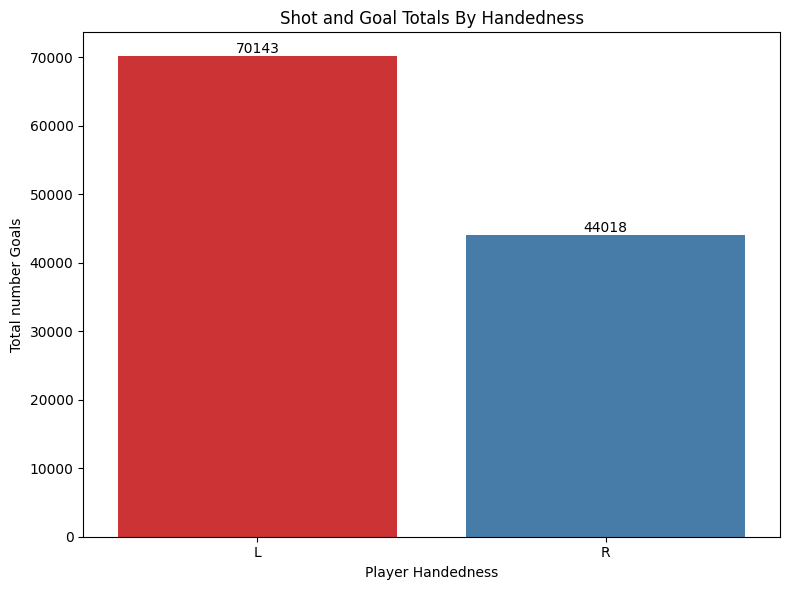

In [54]:


plt.figure(figsize=(8,6))
ax = sns.barplot(data=melted_df_player_handiness2, x='shooterLeftRight', y='rate', hue='shooterLeftRight', palette="Set1")

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f')  # or use fmt='%.2f' for floats

plt.title('Shot and Goal Totals By Handedness')
plt.ylabel('Total number Goals')
plt.xlabel('Player Handedness')
plt.tight_layout()
plt.show()

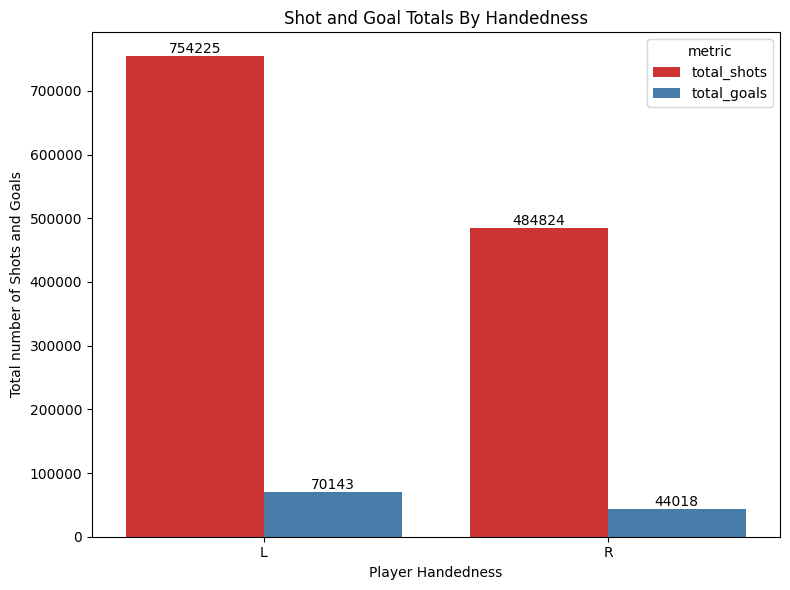

In [39]:
plt.figure(figsize=(8,6))
ax = sns.barplot(data=melted_df_player_handiness, x='shooterLeftRight', y='rate', hue='metric', palette="Set1")

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f')  # or use fmt='%.2f' for floats

plt.title('Shot and Goal Totals By Handedness')
plt.ylabel('Total number of Shots and Goals')
plt.xlabel('Player Handedness')
plt.tight_layout()
plt.show()

In [41]:
player_data = pd.read_csv(r"C:\Users\Travi\OneDrive\Documents\GitHub\Springboard-Data-Science-Capstone-Project-2\Raw_data\allPlayersLookup.csv")

In [42]:
my_list=['G']
players = player_data[~player_data.position.isin(my_list)]
player_data['shootsCatches'].value_counts()

shootsCatches
L    1938
R    1003
Name: count, dtype: int64

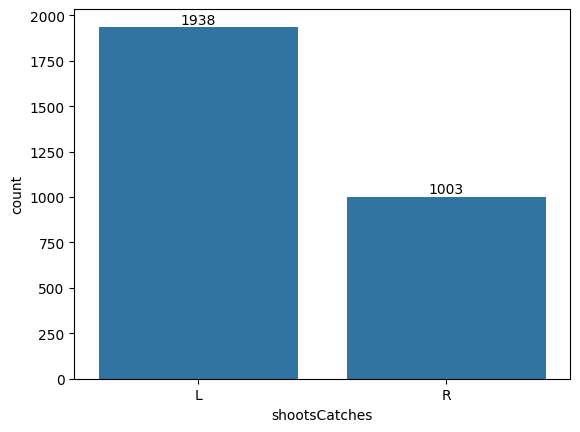

In [43]:
ax = sns.countplot(data=player_data, x='shootsCatches')
# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f')  # or use fmt='%.2f' for floats

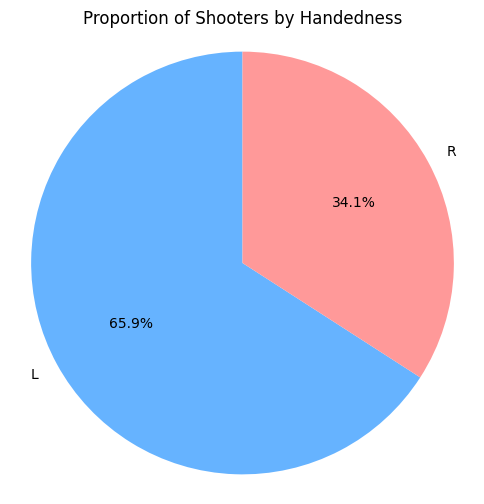

In [44]:
handedness_counts = player_data['shootsCatches'].value_counts()

# Plot pie chart
plt.figure(figsize=(6,6))
plt.pie(handedness_counts, labels=handedness_counts.index, autopct='%1.1f%%', startangle=90, colors=['#66b3ff','#ff9999'])
plt.title('Proportion of Shooters by Handedness')
plt.axis('equal')  # Equal aspect ratio ensures pie is circular.
plt.show()

In [44]:
goalies = player_data[player_data.position.isin(my_list)]
goalies.position.value_counts()

position
G    306
Name: count, dtype: int64

In [45]:
# Create angel bins for plotting shooter handiness at different angles
angle_bins = np.arange(-90, 90, 5)
shots_07_22_cleaned['angle_bin'] = pd.cut(shots_07_22_cleaned['shotAngle'], bins=angle_bins, right=False)
shots_07_22_cleaned['angle_bin_str'] = pd.DataFrame(shots_07_22_cleaned['angle_bin'].astype(str))  # new column as string labels

In [46]:
# Calculating goal rates at different angles per shooter handiness
goal_rates = shots_07_22_cleaned.groupby(['shooterLeftRight', 'angle_bin_str'], observed=False)['goal'].mean().reset_index()

In [47]:
# Create ordered categories
ordered_bins = [str(b) for b in pd.cut(shots_07_22_cleaned['shotAngle'], bins=angle_bins, right=False).cat.categories]
angle_cat_type = CategoricalDtype(categories=ordered_bins, ordered=True)

# Apply ordered category
goal_rates['angle_bin_str'] = goal_rates['angle_bin_str'].astype(angle_cat_type)

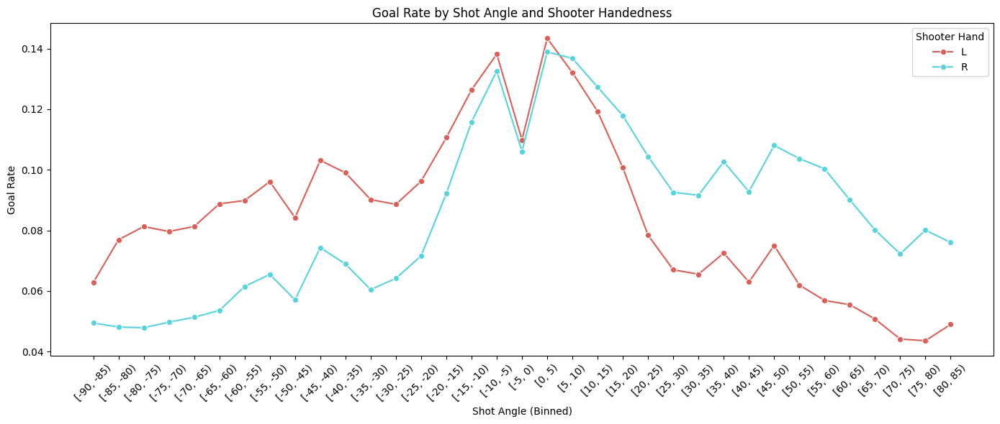

In [48]:
# Plot shooter handiness at different angles
plt.figure(figsize=(14, 6))
sns.lineplot(data=goal_rates, x='angle_bin_str', y='goal', hue='shooterLeftRight', marker='o', palette = "hls")

plt.xticks(rotation=45)
plt.xlabel('Shot Angle (Binned)')
plt.ylabel('Goal Rate')
plt.title('Goal Rate by Shot Angle and Shooter Handedness')
plt.legend(title='Shooter Hand')
plt.tight_layout()
plt.show()

### Observations

When evaluating shooter handedness among all goals in the dataset, left-handed shooters scored 1.6 times as many goals as right-handed shooters. When investigating this trend deeper, it was found that there are about 1.9 times as many left-handed shooters in the NHL than there are right-handed shooters. This imbalance alone could possibly explain why we see more goals scored from left-handed shooters.  

Goalie handiness was also investigated and about 92% of goals catch with their left hand. This suggests that goalie handedness does not play a large role, if any, in the success of a goal regardless of the shooter’s handedness.  

Next, shooter handedness was compared with shot angle to determine if the shooter had any advantages at certain angles. As expected, left-handed shooters were able to convert more goals on the right side of the ice (negative angles) and right-handed shooters were able to convert more goals on the left side of the ice (positive angles).  

This suggests that the players’ handedness, alone, does not play a significant role in determining if a shot becomes a goal

### Shot Rebound

In [49]:
# Calculating the amount of total shots that were rebounds and the average xGoal for those shots
rebound_shots = shots_07_22_cleaned['shotRebound'].value_counts().reset_index()
rebound_xG = shots_07_22_cleaned.groupby('shotRebound').agg(Avg_xG=('xGoal', 'mean')).reset_index()
rebound_shots = pd.merge(rebound_shots, rebound_xG, on='shotRebound', how='left').reset_index()
rebound_shots = rebound_shots.drop('index', axis=1)
rebound_shots = rebound_shots.rename({'count' : 'shotCount'}, axis=1)
rebound_shots

,shotRebound,shotCount,Avg_xG
0,0,1162697,0.060770
1,1,76352,0.232133


In [50]:
# Calculating the amount of total goals that were rebounds and the average xGoal for those goals
rebound_goals = all_goals['shotRebound'].value_counts().reset_index()
rebound_goals = rebound_goals.rename({'count' : 'goalCount'}, axis=1)
rebound_xG2 = all_goals.groupby('shotRebound').agg(Avg_xG=('xGoal', 'mean'))
rebound_goals = pd.merge(rebound_goals, rebound_xG2, on='shotRebound', how='left')
rebound_goals

,shotRebound,goalCount,Avg_xG
0,0,95237,0.176203
1,1,18924,0.349176


In [51]:
# Merge both dataframes to compare both shots and goals
rebound_shots2 = pd.merge(rebound_shots, rebound_goals, on='shotRebound', how='outer')
rebound_shots2

,shotRebound,shotCount,Avg_xG_x,goalCount,Avg_xG_y
0,0,1162697,0.060770,95237,0.176203
1,1,76352,0.232133,18924,0.349176


In [52]:
# Adding goal conversion column 
rebound_shots2['goal_conversion'] = 100 * (rebound_shots2['goalCount'] / rebound_shots2['shotCount'])
rebound_shots2

,shotRebound,shotCount,Avg_xG_x,goalCount,Avg_xG_y,goal_conversion
0,0,1162697,0.060770,95237,0.176203,8.191042
1,1,76352,0.232133,18924,0.349176,24.785205


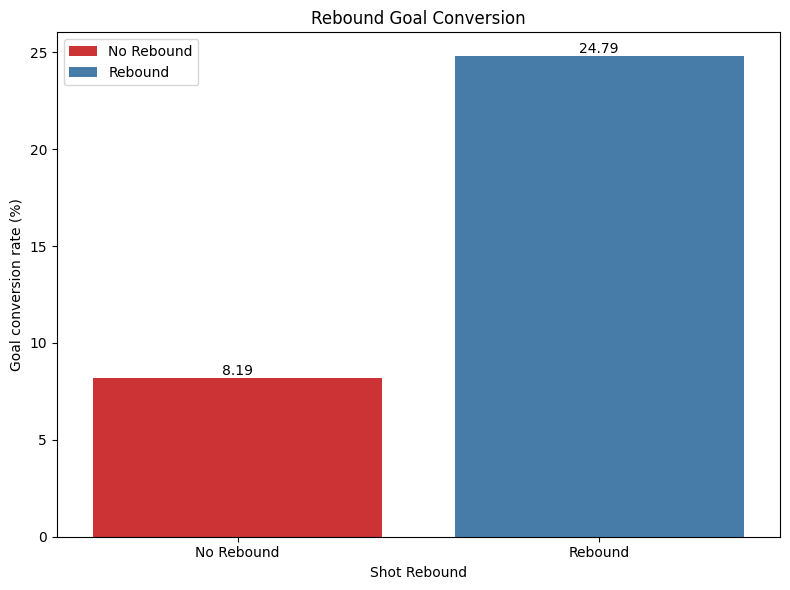

In [53]:
labels = ['No Rebound', 'Rebound']
x = np.arange(len(labels))

# Create the bar plot
plt.figure(figsize=(8,6))
ax = sns.barplot(data=rebound_shots2, x='shotRebound', y='goal_conversion', hue='shotRebound',palette="Set1")

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')  # or use fmt='%.2f' for floats

plt.title('Rebound Goal Conversion')
plt.ylabel('Goal conversion rate (%)')
plt.xlabel('Shot Rebound')
plt.tight_layout()
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(handles=ax.legend_.legend_handles, labels=['No Rebound', 'Rebound'])
plt.show()

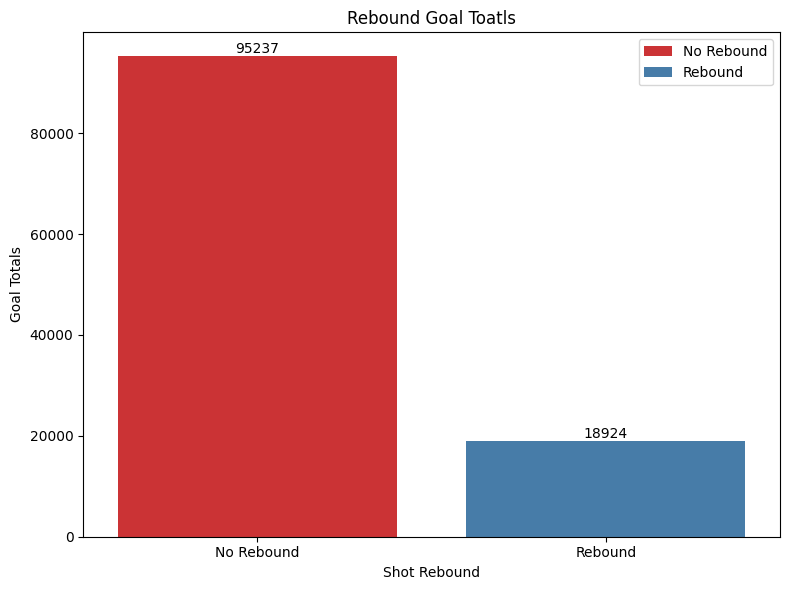

In [54]:
# Create the bar plot
plt.figure(figsize=(8,6))
ax = sns.barplot(data=rebound_goals, x='shotRebound', y='goalCount', hue='shotRebound',palette="Set1")

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f')  # or use fmt='%.2f' for floats

plt.title('Rebound Goal Toatls')
plt.ylabel('Goal Totals')
plt.xlabel('Shot Rebound')
plt.tight_layout()
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(handles=ax.legend_.legend_handles, labels=['No Rebound', 'Rebound'])
plt.show()

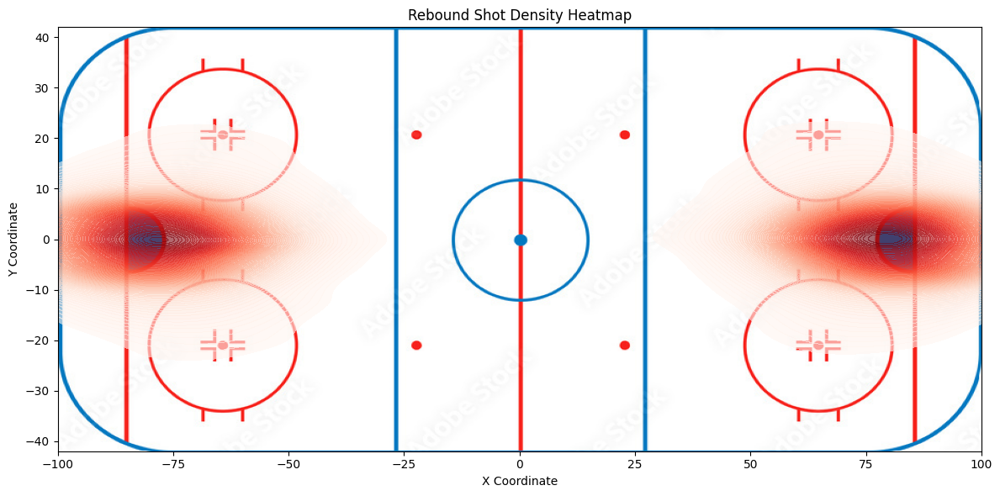

In [55]:
# Visulize location density of rebound goals

# Load the rink image
rink = mpimg.imread(r"C:\Users\Travi\Downloads\rink2.png")  # make sure this file exists in your working directory

# Filter to rebound shots
rebound_shots = all_goals[all_goals['shotRebound'] == True]

# Set up plot
plt.figure(figsize=(12, 6))

# Plot rink image first
plt.imshow(rink, extent=[-100, 100, -42, 42], aspect='auto', zorder=0)

# KDE heatmap overlaid
sns.kdeplot(
    data=rebound_shots,
    x='xCord',
    y='yCord',
    fill=True,
    cmap='Reds',
    bw_adjust=1,
    alpha=0.6,
    levels=100,
    zorder=1  # plot on top of image
)

# Formatting
plt.title('Rebound Shot Density Heatmap')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.xlim(-100, 100)
plt.ylim(-42, 42)
plt.grid(False)
plt.tight_layout()
plt.show()

### Observations

Rebond shots are often more dangerous due to their proximity to the net and the goaltender being out of position. The data supports this claim as well. The average xGoal probability on all rebound goals was 35% with non-rebound goals only having an average xGoal probability of 18%. The goal conversion rate among rebound shots was also much higher than non-rebound shots: 25% compared to 8%. This suggests that a shot being a rebound does have a higher chance of being a goal. 

## Evaluating Remaining Features

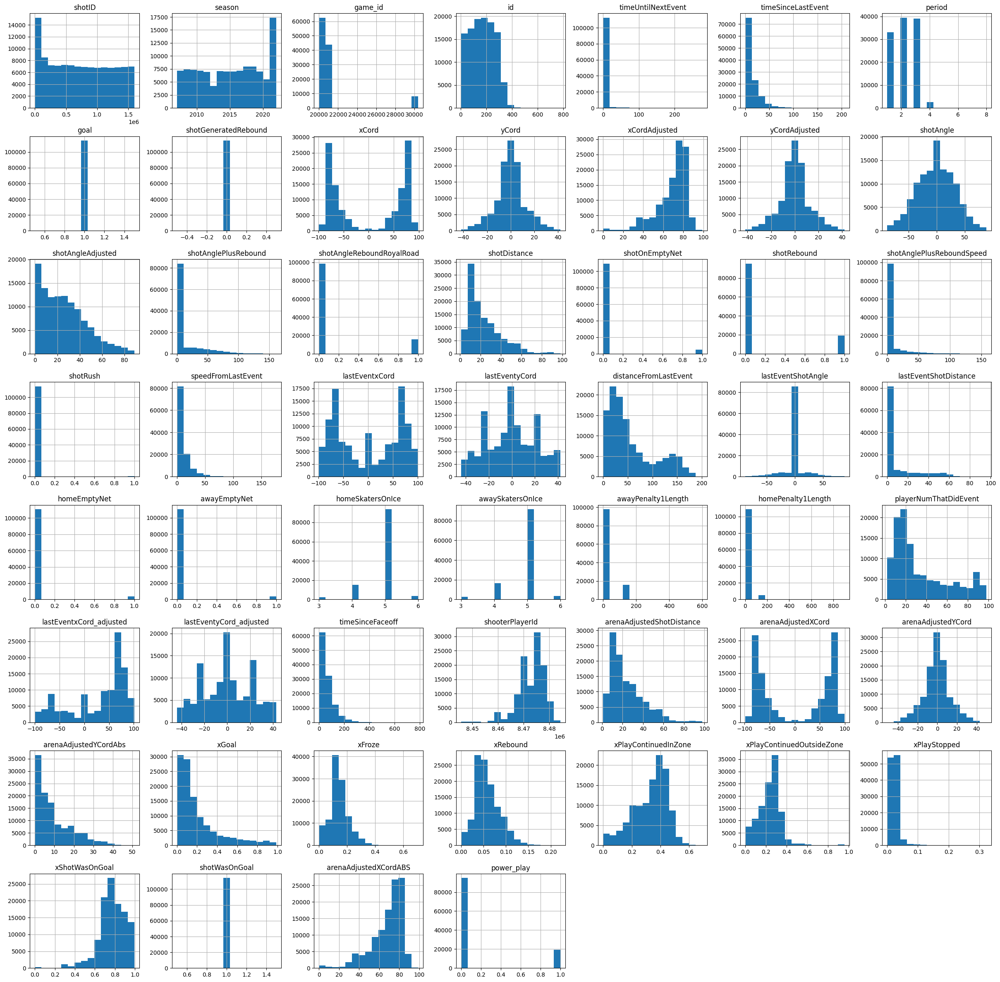

In [56]:
#Plotting the remaining numberical features

all_goals.hist(bins= 15, figsize=(30,30))
plt.show()

### Observations:  
The distributions for the numeric features are within expectation given some domain knowledge of hockey. There is some mix of uniformly distributed features and skewed features. I will most likely have to preform some form of transformation on my data in the next stage.   

  Features of current interest:  

* Distance from the net = It appears most goals are scored close to the net, within 15 feet or so. This is expected and given the pretty heavy right skew of the distribution, I would say this is a good sign of being a key factor for my model.  

* Angle of the shot = The shot angle has a pretty good bell shape and normal distribution with a spike in the center at 0. This is expected as a shot at 0 would be directly in front of the center of the goal and in theory would give the shot a higher probability of being a goal.

Overall these distributions have helped support these features of interest being key factors in goal prediction. However, there are still the categorical features to explore along with feature correlation before we can move forward with confidence.

In [57]:
#Subset the data frame for categorical features

object_columns = all_goals.select_dtypes(object)
object_columns_no_shooter = object_columns.drop(['shooterName', 'event', 'situation'], axis=1)

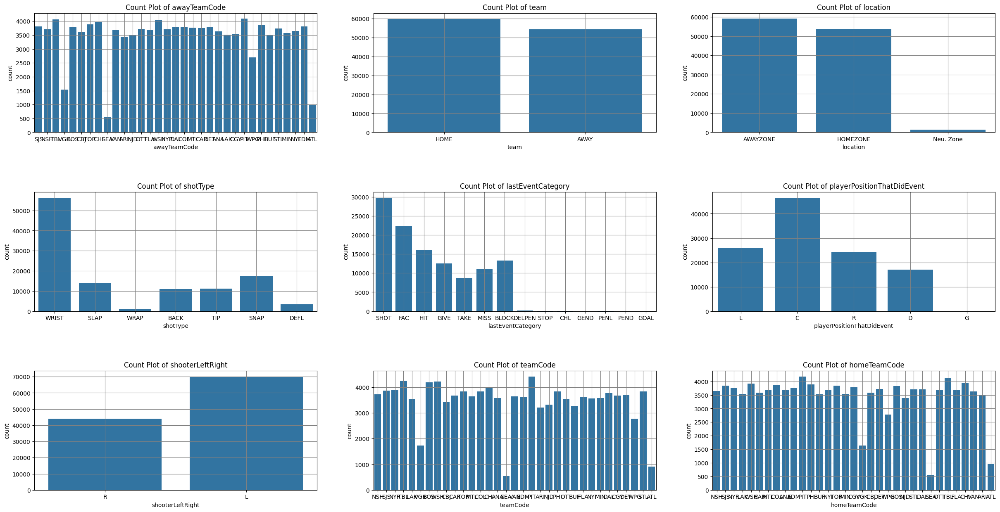

In [58]:
#Plotting the remaining categorical features

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 15))
cols = object_columns_no_shooter.columns
axes = axes.flatten()

for i, col in enumerate(cols):
    sns.countplot(x=col, data=object_columns_no_shooter, ax=axes[i-1])
    axes[i-1].set_title(f'Count Plot of {col}')
    axes[i-1].grid(True,color = "grey")


plt.subplots_adjust(hspace=0.5)
plt.show()

### Observations:  

  Similarly to the numerical features, the categorical features are within expectation for the most part. There was a few trends that I did find somewhat surprising. 

  The first surprising trend was the fact that left handed shooters outscored right handed shooters by around 25,000. I figured that distribution would be closer. This possibly suggest left handed shooters have a higher probability of scoring goals.  
  
  The second surprising trend was how big the difference was in goals scored by centers compared to other positions. It is expected that other positions like defense are not expected to score as much. I did not anticipate as large of a gap between center and the wing players. This feature will be of further interest. 

   Features of current interest:  

   * Type of shot = This distribution is skewed pretty heavily towards wrist shots. I knew that wrist shots are the most common and is a easier shot from a technical standpoint than the other types of shots. However, I was not expecting the large gap between wrist shot and its closest competitor the snap shot with a difference of around 40,000. This is also a good indicator that this will be a key feature. 
   * Event before the shot = This distribution is well within expectations. There was not really any surprises. It is fairly skewed towards a shot being the last event before a goal, suggesting most goals come after a previous shot or rebound. However, we will need further investigation to determine if this will be a key factor.


# Visualizing Goal Locations 

Next, I wanted to see if there was any ready trend or pattern in the locations of goals scored. 

In [59]:
#Creating a subset of the dataframe to include shot locations based on season

goal_locations = all_goals[['xCord', 'yCord','season']]
goal_locations_by_season = goal_locations.groupby('season')

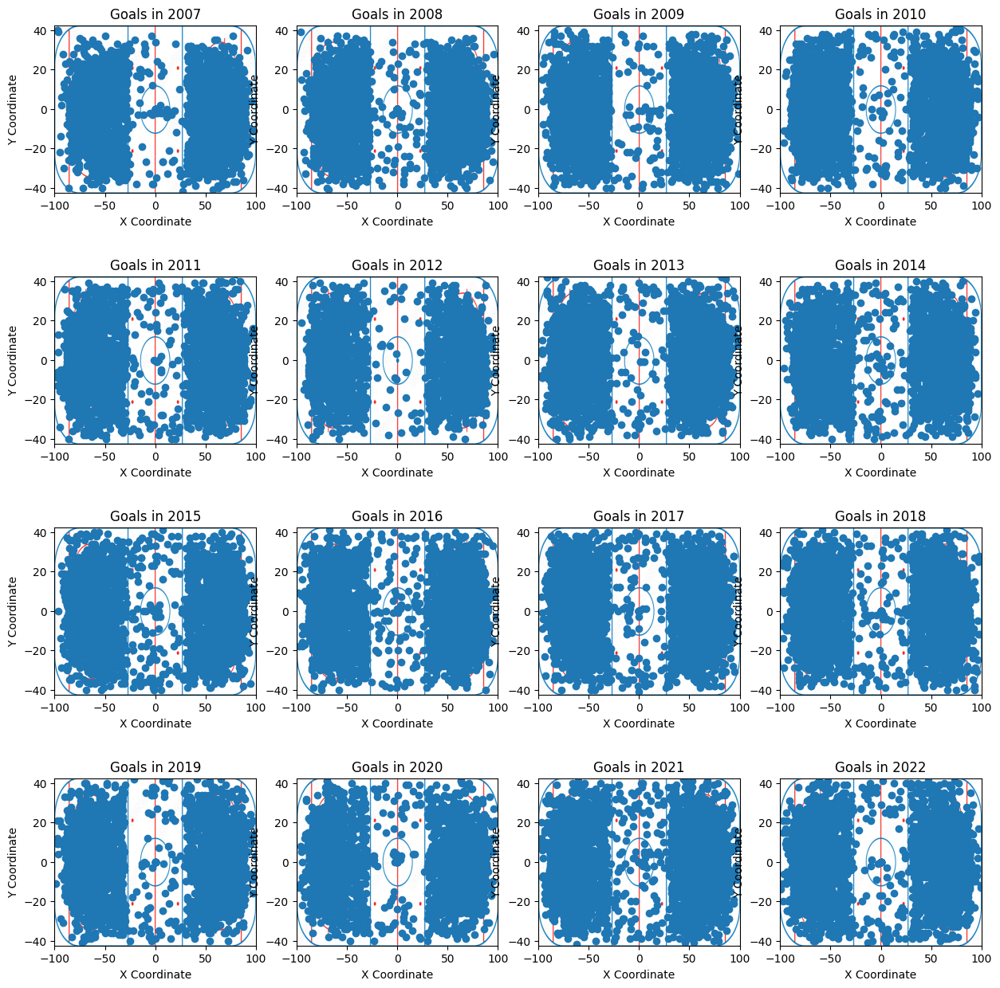

In [60]:
#Visualizing shot locations across all seasons

seasons = list(range(2007,2023))
img = mpimg.imread(r"C:\Users\Travi\Downloads\rink2.png")
fig, axs = plt.subplots(4, 4, figsize=(15, 15))
axs = axs.flatten()


for i, season in enumerate(seasons):
    season_data = goal_locations[goal_locations['season'] == season]
    axs[i].scatter(season_data['xCord'], season_data['yCord'])
    axs[i].set_title(f'Goals in {season}')
    axs[i].set_xlabel('X Coordinate')
    axs[i].set_ylabel('Y Coordinate')
    axs[i].imshow(img, extent=[-100, 100, -42.5, 42.5], aspect='auto', zorder=-1)
    plt.subplots_adjust(hspace=0.5);
plt.show()


### Observations  

  There is no real pattern or trend in goal locations. As expected, much fewer goals are scored in the center section of the ice. But there does not appear to be a clear indication that more goals are scored in one particular area.

Due to the somewhat large dimensionality of my dataset, I want to look at the PCA to get a sense if I can possibly reduce the dimensionality of my dataset without sacrificing model performance.

In [61]:
#isolate the numeric columns of my data set
numeric_columns = all_goals.select_dtypes(include= ('int', 'float64'))
scaled_columns = numeric_columns.columns

#scaling the data for PCA

all_goals_scaled = scale(numeric_columns)
all_goals_scaled_df = pd.DataFrame(all_goals_scaled, columns=scaled_columns)
all_goals_scaled_df.head()

,shotID,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,goal,shotGeneratedRebound,xCord,...,xGoal,xFroze,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,arenaAdjustedXCordABS,power_play
0,-1.502810,1.552362,-0.514184,-1.641464,-0.118065,-0.755647,-1.295133,0.0,0.0,-1.051312,...,0.437436,0.431551,1.278965,-0.844706,-0.505386,0.047486,0.955323,0.0,0.491647,-0.451328
1,-1.502783,1.552362,-0.514184,-1.147693,-0.118065,0.949481,-1.295133,0.0,0.0,1.094979,...,-0.611928,-0.329229,0.435653,0.712085,0.567465,-0.256061,0.224228,0.0,0.746918,-0.451328
2,-1.502738,1.552362,-0.514184,-0.278227,-0.118065,0.472045,-0.116199,0.0,0.0,0.883174,...,-0.647002,-0.202524,-0.712223,0.767376,0.776662,-0.178887,-0.582636,0.0,-0.210349,-0.451328
3,-1.502685,1.552362,-0.514184,0.494632,-0.118065,-0.278211,-0.116199,0.0,0.0,0.883174,...,-0.648321,-0.481830,-0.208376,0.688393,0.932992,-0.292860,-0.470539,0.0,-0.146531,-0.451328
4,-1.502629,1.552362,-0.514184,1.600250,3.864228,2.177172,1.062735,0.0,0.0,-0.811266,...,2.487039,-1.851262,-1.302611,-1.717472,-1.358060,-1.066581,-0.386438,0.0,-0.529437,-0.451328


In [62]:
#fit and plot the PCA

goals_pca = PCA().fit(all_goals_scaled)

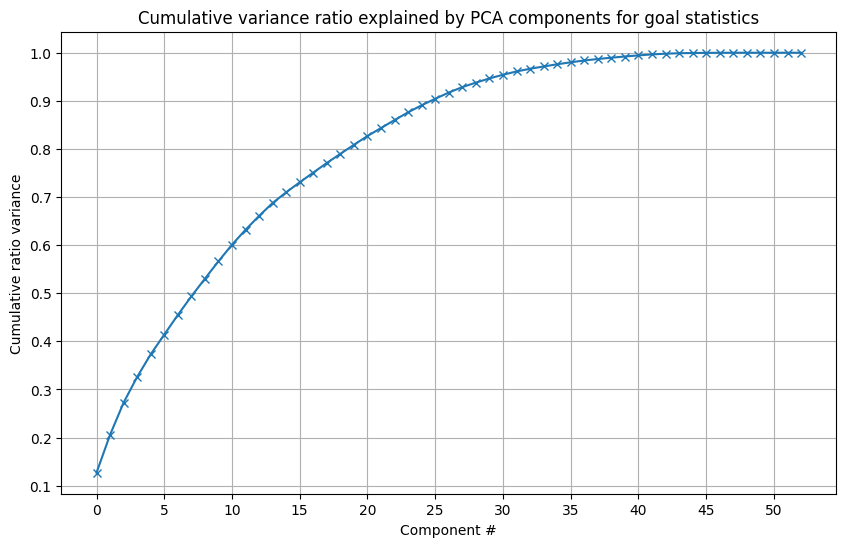

In [63]:
plt.subplots(figsize=(10, 6))
plt.plot(goals_pca.explained_variance_ratio_.cumsum(), marker='x')
plt.grid()
plt.xticks([0,5,10,15,20,25,30,35,40,45,50])
plt.yticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for goal statistics');

### Observations:  

  The PCA plot above again strengthens a case to reduce the dimensionality of my data set to obtain a more accurate model.  

The first 18 components account for around 80% of the variance and the first 25 components account for 90% of the variance. 

In [64]:
principal_components = goals_pca.components_
print("Principal Components:\n", principal_components)

# Transform the data to the new feature space
transformed_data = goals_pca.transform(all_goals_scaled_df)
print("Transformed Data:\n", transformed_data)

# Explained variance ratio
explained_variance = goals_pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance)

Principal Components:
 [[-4.41442540e-03  3.39136563e-03 -1.65293672e-03 ... -0.00000000e+00
  -3.14873435e-01 -1.66199104e-02]
 [ 6.03224426e-03  5.56033232e-04  1.53223081e-02 ... -0.00000000e+00
  -1.48700517e-01 -1.00502039e-01]
 [ 2.90692173e-02 -5.44296368e-02  2.74550458e-04 ...  0.00000000e+00
  -2.17126555e-01  1.98280062e-01]
 ...
 [ 1.00821306e-17  1.19507384e-16  4.47030159e-17 ... -0.00000000e+00
   1.94289029e-16 -2.77555756e-17]
 [ 0.00000000e+00  5.98479599e-17 -7.17954762e-17 ...  3.33066907e-15
   3.88578059e-16  0.00000000e+00]
 [ 0.00000000e+00  1.62115321e-18 -5.84417714e-18 ...  1.00000000e+00
   6.54177538e-19 -1.12286330e-17]]
Transformed Data:
 [[-3.66547896e+00  1.08191064e+00  1.20871719e+00 ...  2.61224590e-16
   1.26084496e-16  3.79800589e-16]
 [-2.04087426e-01 -2.04804073e+00 -8.79662014e-01 ...  3.49410428e-16
  -2.92687723e-16  8.61841206e-17]
 [ 2.32316420e-01  4.09822776e-01  1.63892256e+00 ... -3.09047706e-16
  -3.52749640e-16  6.27014168e-17]
 ...
 [

C:\Users\Travi\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


## Visualizing Correlations Between Features

In [65]:
# Correlation with my target variable goal
numeric_columns_shots = shots_07_22_cleaned.select_dtypes(include= ('int', 'float64'))
corrmat_goals2 = numeric_columns_shots.corr()
goal_corr = corrmat_goals2['goal'].sort_values(ascending=False)
print(goal_corr)

goal                         1.000000
xGoal                        0.416959
shotOnEmptyNet               0.197939
arenaAdjustedXCordABS        0.146969
xCordAdjusted                0.146670
shotRebound                  0.137970
xShotWasOnGoal               0.117326
shotAnglePlusReboundSpeed    0.116279
xRebound                     0.100065
awayEmptyNet                 0.068443
homeEmptyNet                 0.063222
speedFromLastEvent           0.052165
shotAngleReboundRoyalRoad    0.044334
shotAnglePlusRebound         0.041294
lastEventShotDistance        0.040153
xPlayStopped                 0.030474
id                           0.030443
lastEventxCord_adjusted      0.029744
period                       0.025134
awayPenalty1Length           0.020821
shotRush                     0.018585
playerNumThatDidEvent        0.017213
season                       0.006687
yCord                        0.006280
arenaAdjustedYCord           0.006186
shooterPlayerId              0.006153
lastEventyCo

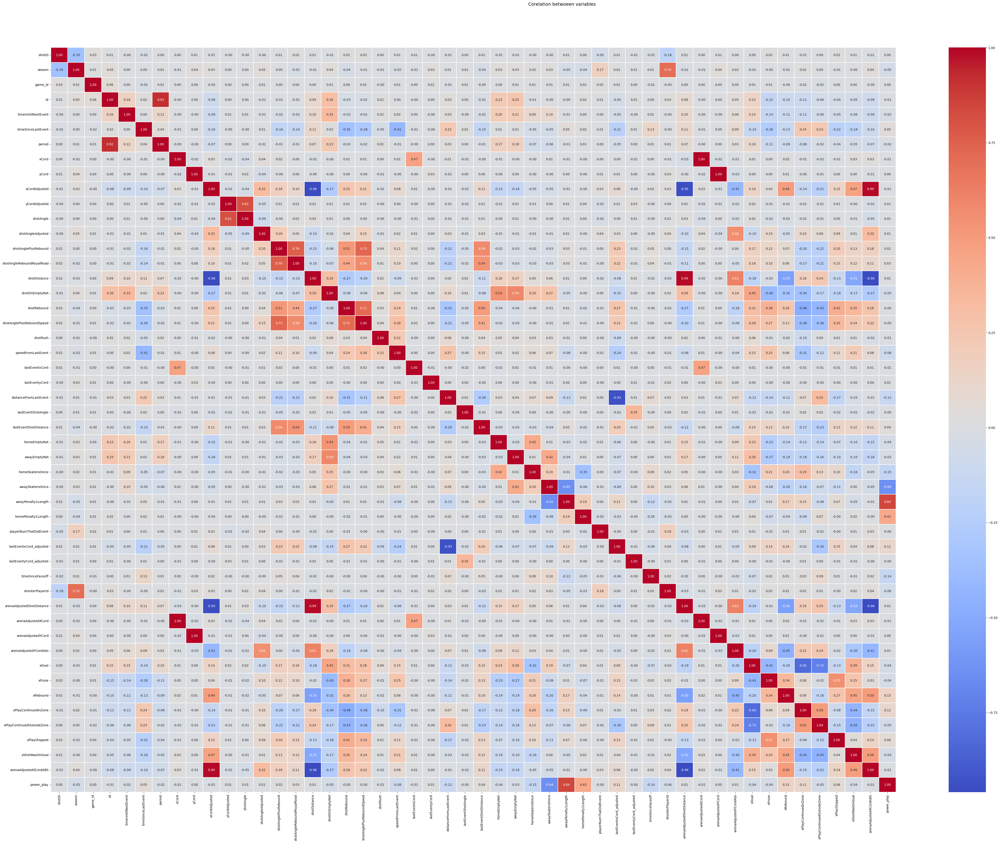

In [66]:
#Correlation heatmap of the numeric columns of the all_goals data frame
corrmat_goals = numeric_columns.drop(numeric_columns[['goal','shotGeneratedRebound', 'shotWasOnGoal']], axis=1).corr()
f, ax = plt.subplots(figsize=(60, 40))
hm = sns.heatmap(round(corrmat_goals,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Corelation betwoeen variables', fontsize=14)

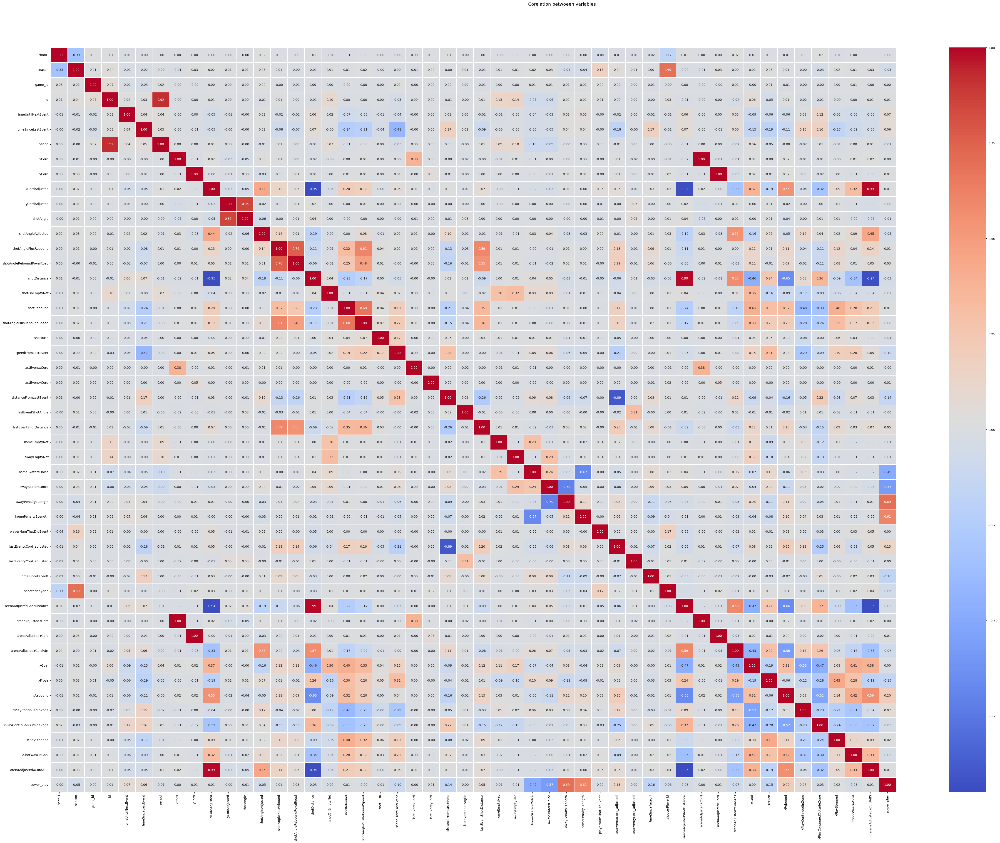

In [67]:
#Correlation heatmap of the numeric columns of the shots_07_22_cleaned data frame
corrmat_shots = numeric_columns_shots.drop(numeric_columns_shots[['goal', 'shotGeneratedRebound','shotWasOnGoal']], axis=1).corr()
f, ax = plt.subplots(figsize=(60, 40))
hm = sns.heatmap(round(corrmat_shots,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Corelation betwoeen variables', fontsize=14)

Due to the large amount of variables, the heatmap allowed me to visually identify some possible moderate and strong correlations. However, I will need to take a closer look at the numbers which is a little difficult with this amount of features.  

  I will start by looking at the target feature and compare the correlation with the remaining features.

In [68]:
# Corriclation between the taget feature xGoal (The probability the shot will be a goal) and the remaining features

target_corr = numeric_columns[numeric_columns.columns[1:]].corr()['xGoal'][:].dropna()
target_corr.sort_values(ascending=False)

xGoal                        1.000000
shotOnEmptyNet               0.451395
xShotWasOnGoal               0.394471
shotRebound                  0.306093
awayEmptyNet                 0.298456
shotAnglePlusReboundSpeed    0.276862
homeEmptyNet                 0.232104
awaySkatersOnIce             0.190350
shotAnglePlusRebound         0.166923
shotAngleReboundRoyalRoad    0.156135
arenaAdjustedXCordABS        0.152618
timeUntilNextEvent           0.151507
speedFromLastEvent           0.146254
id                           0.145513
lastEventShotDistance        0.145426
xCordAdjusted                0.143605
period                       0.095784
lastEventxCord_adjusted      0.091280
shotRush                     0.060939
homePenalty1Length           0.043734
shotAngle                    0.017117
yCordAdjusted                0.016580
arenaAdjustedXCord           0.014330
xCord                        0.014167
lastEventxCord               0.013743
game_id                      0.012465
playerNumTha

### Observations:  

  It appears that our target feature has does not have a moderate correlation with any features. The closest was with shotOnEmptyNet with r=0.45 or xFroze at r=-4.1

  The target feature has a strong correlation with the following features:  
  * xPlayContinuedOutsideZone = -0.724290 - The probability that the play leaves the zone after the shot - negative correlation
  * xPlayContinuedInZone = -0.819645 - The probability that the play will continue in the zone after the shot. Defined as the next event after the shot also occurring in the offensive zone and no player changes occurring. Does not include the xRebound probability - negative correlation


  This could be an indication of multicollinearity which I suspected in the beginning with other features. I will investigate multicollinearity with those other features in the next step.

## Determine Strength Of Feature Correlation

Next I wanted to find all the features that had moderate and strong correlations between each other.

In [69]:
#Subsetting correlation map to include only correlations that are considered moderate (above 0.3) and strong (above 0.7)

lower_threshold = 0.4
upper_threshold = 0.7

subset_df = corrmat_goals[(abs(corrmat_goals) > lower_threshold) | (abs(corrmat_goals) < upper_threshold)].fillna(0)
subset_df.head()

,shotID,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,xCord,yCord,xCordAdjusted,...,arenaAdjustedYCordAbs,xGoal,xFroze,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,arenaAdjustedXCordABS,power_play
shotID,1.000000,-0.348711,0.030158,0.010336,-0.000547,-0.015160,0.004449,0.003245,0.005674,-0.008387,...,0.004299,0.001875,0.019031,0.009418,-0.012624,0.001511,0.016078,0.009226,-0.009035,0.003160
season,-0.348711,1.000000,0.005505,0.051399,0.003239,0.001858,0.010283,-0.010650,0.042595,0.026044,...,0.023596,-0.006813,-0.001906,-0.005911,0.020897,0.001073,-0.005630,-0.001176,0.035238,-0.050842
game_id,0.030158,0.005505,1.000000,0.064761,0.004171,-0.023863,0.014316,0.003632,0.002502,-0.000809,...,0.004893,0.012465,0.005120,-0.002831,-0.010225,-0.019178,0.002770,0.004289,-0.001023,0.004966
id,0.010336,0.051399,0.064761,1.000000,0.158047,0.020998,0.920620,-0.003791,0.003733,-0.081411,...,0.045239,0.145513,-0.145192,-0.101716,-0.107692,-0.059299,-0.042028,-0.053771,-0.080347,-0.007375
timeUntilNextEvent,-0.000547,0.003239,0.004171,0.158047,1.000000,0.004127,0.120547,-0.000539,-0.000628,-0.093693,...,0.062700,0.151507,-0.136472,-0.106725,-0.109266,-0.060923,-0.052515,-0.059736,-0.092974,-0.015628


In [70]:
#Data frame of features with moderate correlation

result_moderate = pd.DataFrame(abs(subset_df)[abs(subset_df) > lower_threshold].stack())
result_moderate = pd.DataFrame(result_moderate[result_moderate < upper_threshold].stack())
result_moderate = result_moderate.reset_index(level=2, drop=True)
result_moderate[0].sort_values(ascending=False)

season                     shooterPlayerId              0.697220
shooterPlayerId            season                       0.697220
awaySkatersOnIce           awayPenalty1Length           0.645523
awayPenalty1Length         awaySkatersOnIce             0.645523
power_play                 awaySkatersOnIce             0.637596
                                                          ...   
xFroze                     xGoal                        0.412730
lastEventShotDistance      shotAnglePlusReboundSpeed    0.405471
shotAnglePlusReboundSpeed  lastEventShotDistance        0.405471
arenaAdjustedYCordAbs      xCordAdjusted                0.405094
xCordAdjusted              arenaAdjustedYCordAbs        0.405094
Name: 0, Length: 84, dtype: float64

In [71]:
#list of variables that had moderate correlation

pairs_mod = list(result_moderate.index)
pairs_mod

[('season', 'shooterPlayerId'),
 ('timeSinceLastEvent', 'speedFromLastEvent'),
 ('xCord', 'lastEventxCord'),
 ('xCordAdjusted', 'arenaAdjustedYCordAbs'),
 ('xCordAdjusted', 'xRebound'),
 ('xCordAdjusted', 'xShotWasOnGoal'),
 ('shotAngleAdjusted', 'arenaAdjustedYCordAbs'),
 ('shotAnglePlusRebound', 'shotRebound'),
 ('shotAnglePlusRebound', 'lastEventShotDistance'),
 ('shotAngleReboundRoyalRoad', 'shotRebound'),
 ('shotAngleReboundRoyalRoad', 'shotAnglePlusReboundSpeed'),
 ('shotAngleReboundRoyalRoad', 'lastEventShotDistance'),
 ('shotDistance', 'arenaAdjustedYCordAbs'),
 ('shotDistance', 'xRebound'),
 ('shotDistance', 'xShotWasOnGoal'),
 ('shotOnEmptyNet', 'homeEmptyNet'),
 ('shotOnEmptyNet', 'awayEmptyNet'),
 ('shotOnEmptyNet', 'xGoal'),
 ('shotRebound', 'shotAnglePlusRebound'),
 ('shotRebound', 'shotAngleReboundRoyalRoad'),
 ('shotRebound', 'lastEventShotDistance'),
 ('shotRebound', 'xPlayContinuedInZone'),
 ('shotRebound', 'xPlayContinuedOutsideZone'),
 ('shotRebound', 'xPlayStopped'

In [72]:
#Data frame of features with strong correlation

subset_df2 = corrmat_goals[(abs(corrmat_goals) > upper_threshold)].fillna(0)
result_strong = pd.DataFrame(abs(subset_df2)[abs(subset_df2) > upper_threshold].stack())
result_strong = pd.DataFrame(result_strong[result_strong < 1].stack())
result_strong = result_strong.reset_index(level=2, drop=True)
result_strong[0].sort_values(ascending = False)

xCord                      arenaAdjustedXCord           0.999552
arenaAdjustedXCord         xCord                        0.999552
arenaAdjustedYCord         yCord                        0.996439
yCord                      arenaAdjustedYCord           0.996439
xCordAdjusted              arenaAdjustedXCordABS        0.991237
arenaAdjustedXCordABS      xCordAdjusted                0.991237
arenaAdjustedShotDistance  shotDistance                 0.990561
shotDistance               arenaAdjustedShotDistance    0.990561
xCordAdjusted              shotDistance                 0.963178
shotDistance               xCordAdjusted                0.963178
arenaAdjustedXCordABS      arenaAdjustedShotDistance    0.962325
arenaAdjustedShotDistance  arenaAdjustedXCordABS        0.962325
shotDistance               arenaAdjustedXCordABS        0.955698
arenaAdjustedXCordABS      shotDistance                 0.955698
arenaAdjustedShotDistance  xCordAdjusted                0.952935
xCordAdjusted            

In [73]:
##list of variables that had strong correlation
pairs_strong = list(result_strong.index)
pairs_strong

[('id', 'period'),
 ('period', 'id'),
 ('xCord', 'arenaAdjustedXCord'),
 ('yCord', 'arenaAdjustedYCord'),
 ('xCordAdjusted', 'shotDistance'),
 ('xCordAdjusted', 'arenaAdjustedShotDistance'),
 ('xCordAdjusted', 'arenaAdjustedXCordABS'),
 ('yCordAdjusted', 'shotAngle'),
 ('shotAngle', 'yCordAdjusted'),
 ('shotAnglePlusRebound', 'shotAngleReboundRoyalRoad'),
 ('shotAnglePlusRebound', 'shotAnglePlusReboundSpeed'),
 ('shotAngleReboundRoyalRoad', 'shotAnglePlusRebound'),
 ('shotDistance', 'xCordAdjusted'),
 ('shotDistance', 'arenaAdjustedShotDistance'),
 ('shotDistance', 'arenaAdjustedXCordABS'),
 ('shotRebound', 'shotAnglePlusReboundSpeed'),
 ('shotAnglePlusReboundSpeed', 'shotAnglePlusRebound'),
 ('shotAnglePlusReboundSpeed', 'shotRebound'),
 ('distanceFromLastEvent', 'lastEventxCord_adjusted'),
 ('awayPenalty1Length', 'power_play'),
 ('lastEventxCord_adjusted', 'distanceFromLastEvent'),
 ('arenaAdjustedShotDistance', 'xCordAdjusted'),
 ('arenaAdjustedShotDistance', 'shotDistance'),
 ('are

### Observations  

After looking at the features with a strong correlation, it appears that my suspicion of multicollinearity with some features holding very similar information is correct as we see a very strong, over 0.99, correlation on features such as xCord and areanAdjustedXCord. This is also true of the shot distance and adjusted shot distance.  

This suggests that I can further refine my data frame and remove additional columns to prevent an over complicated model.

In [74]:
#Merging both strong and moderate list to determine all features with moderate and strong correlation
#This will help narrow down the amount of features for the pair plot

merged = list(set(pairs_mod + pairs_strong))
merged = pd.DataFrame(merged)
corr_list = list(merged[0].unique())
len(merged[0].unique())

41

## Visualizing Numeric Fatures with Pair Plots

In [75]:
#Due to the large dimensionality of the data set,
#I subseted data into 5 groups with 1000 random rows of data to improve readability and speed of pair plots.

x = all_goals[corr_list]
x = x.reset_index()

subset_1 = x.iloc[:, 0:10].sample(n=1000, replace=True, random_state=42)
subset_2 = x.iloc[:, 10:20].sample(n=1000, replace=True, random_state=42)
subset_3 = x.iloc[: , 20:30].sample(n=1000, replace=True, random_state=42)
subset_4 = x.iloc[: , 30:37].sample(n=1000, replace=True, random_state=42)

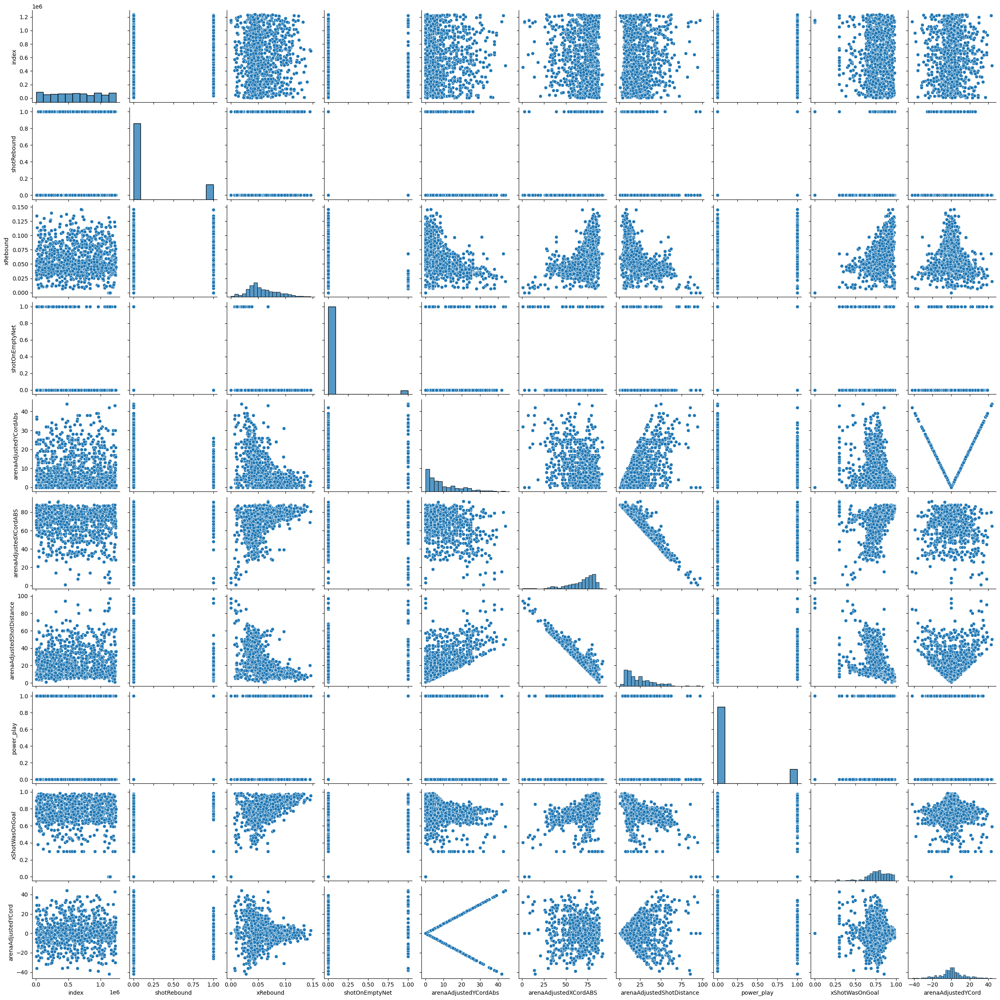

In [76]:
#Pair plot of the first subset

sns.pairplot(subset_1)

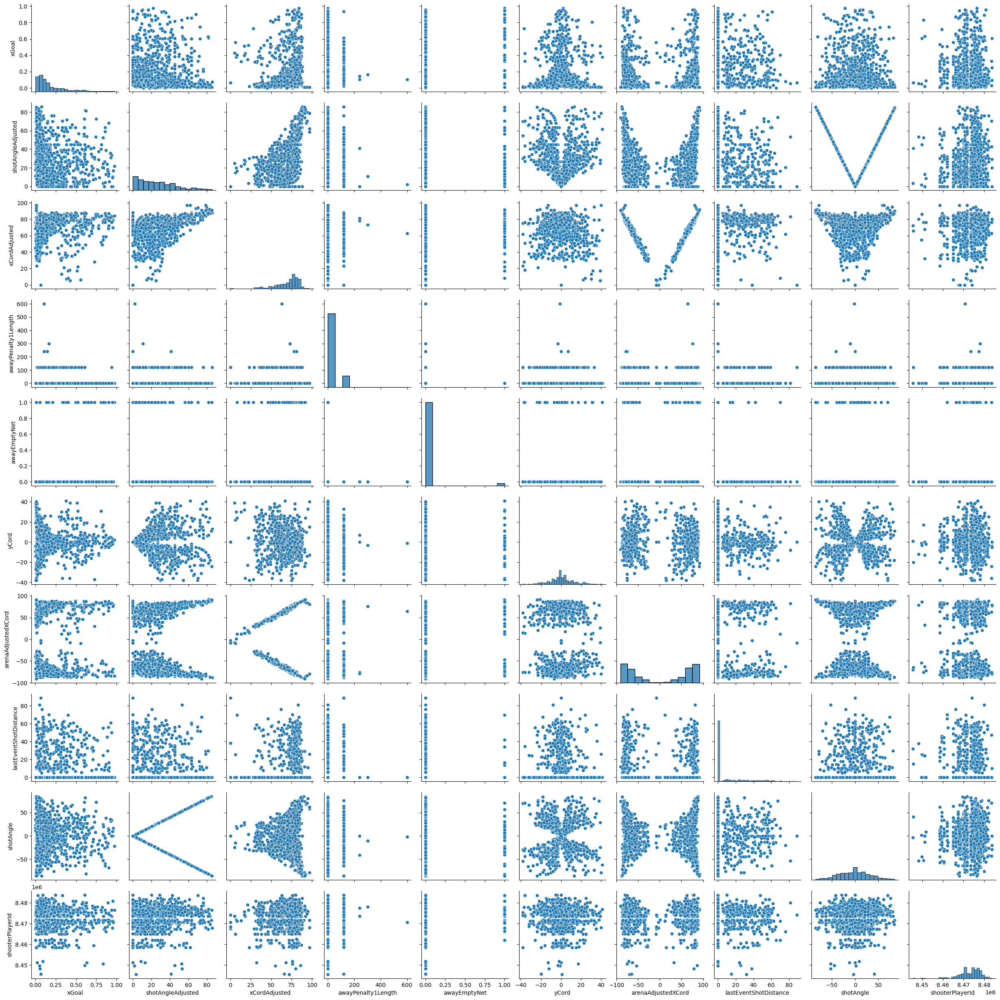

In [77]:
#Pair plot of the second subset

sns.pairplot(subset_2)

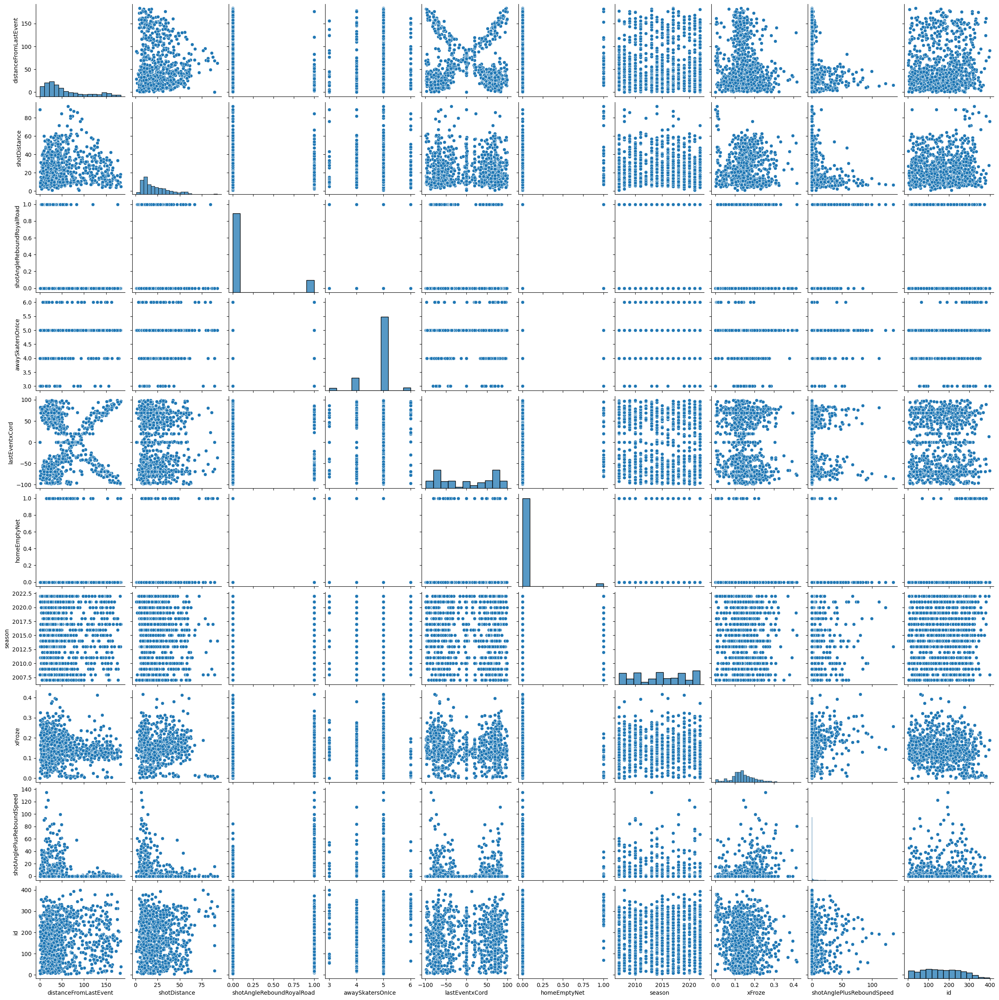

In [78]:
#Pair plot of the third subset

sns.pairplot(subset_3)

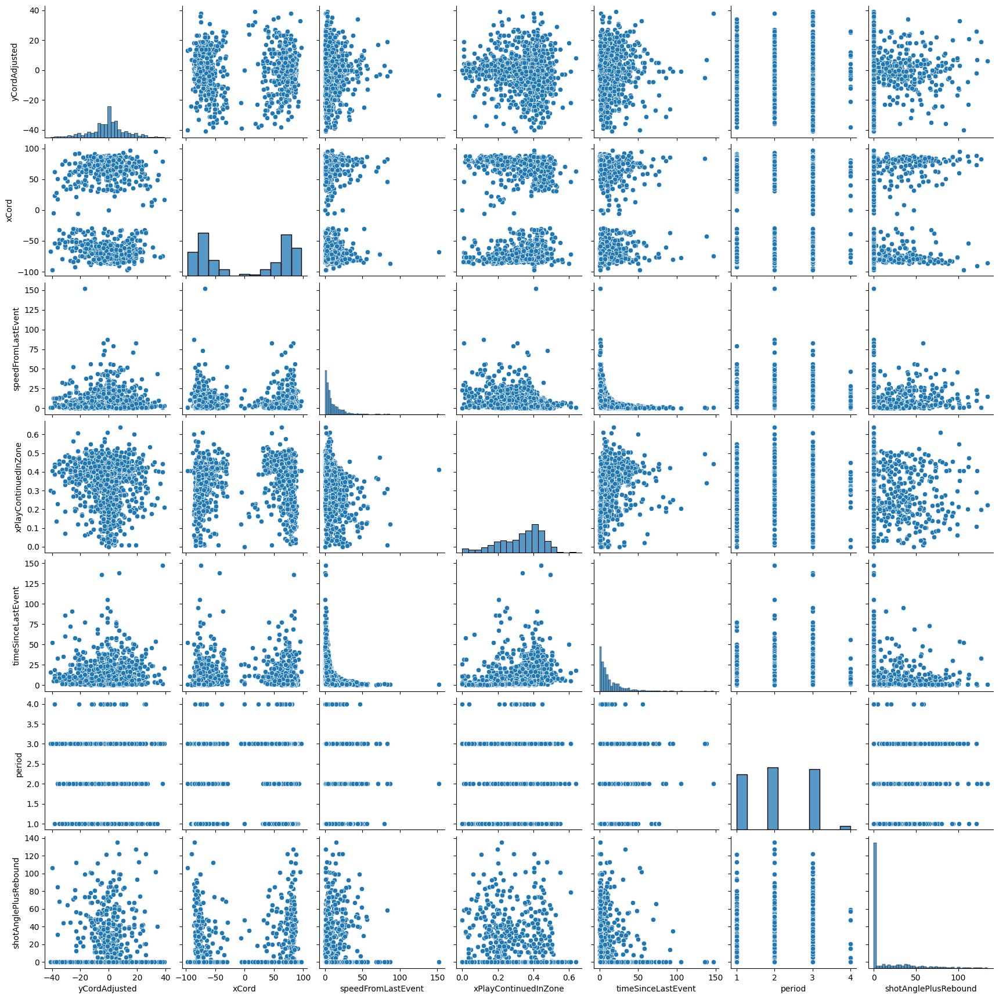

In [79]:
#Pair plot of the fourth subset

sns.pairplot(subset_4)

In [80]:
def save_file(df, directory, filename):
    """
    Save the given DataFrame to the specified directory with the given filename.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to save.
    directory (str): The directory where the DataFrame will be saved.
    filename (str): The name of the file to save the DataFrame as.
    """

    file_path = f"{directory}/{filename}.csv"
    df.to_csv(file_path, index=False)

In [82]:
directory = r'C:\Users\Travi\OneDrive\Documents\GitHub\Springboard-Data-Science-Capstone-Project-2\Cleaned_data'
save_file(shots_07_22_cleaned, directory, 'shots_07_22_cleaned')

## Correlations
The findings from the EDA analysis of the variables and correlations revealed that the strongest negative correlation is between the shotDistance and xCordAdjusted (r=-0.96). This makes sense intuitively, as the x coordinate is the NORTH-SOUTH location from the center of the ice. Therefore, there should be a close relationship between the shot distance and x coordinate of the shot. The negative relationship comes from the x coordinate being adjusted as if all shots were at the right end of the rink. Usually makes the coordinate a positive number. 

Additionally, there were two  moderately strong negative correlations. The first between xGoal and xPlayContinueInZone (r=-0.81). This also makes sense intuitively, as the probability of a shot being a goal goes up, you would expect the probability of the play to continue in the zone to go down, since the play is over if it is a goal.

The second, between shotAngle and yCordAdjusted (r=-0.81). Similarly with the strong negative correlation between xCordAdjusted and shotDistance, the y coordinate is the EAST-WEST location from the center of the ice and a shot angle of 0 would come from the center of the ice. The negative relationship comes from the y coordinate being adjusted as if all shots were at the right end of the rink.

There were some moderate correlations between features such as the following:  
* xRebound ----- shotDistance
* shotDistance ----- xShotWasOnGoal 
* lastEventShotDistance  ----- shotRebound

These correlations are not surprising and intuitively make sense in the sport of hockey.

## Conclusion  

Interestingly, There appears to be low or no significant correlation between the target feature and my current numeric features of interest. However, there is evidence of these features having a impact on predicting goal scoring based on the distribution of the features in the data set.

There are correlations that suggest the possibility of multicollinearity and the need to further reduce the dimensionality of my data set.

The next steps include feature engineering and looking into feature importances to determine which features will provide the best results for the model. 